# IMPORTS

In [350]:
%reload_ext autoreload
%autoreload 2
# GENERAL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd

# LOADING DATA
import requests
import os
import shutil
from io import BytesIO
import osmium
import fiona
import json


# GEOSPATIAL DATA
from shapely.geometry import Point, LineString, MultiPoint
from shapely.geometry import shape 


# PLOTTING DATA
from folium import Map, CircleMarker, Vega, Popup, Marker, PolyLine, Icon, Choropleth, LayerControl
from folium.plugins import MarkerCluster, HeatMap, BeautifyIcon
from folium.features import ColorLine, GeoJsonPopup, GeoJsonTooltip
from folium.map import FeatureGroup
import shapely
import matplotlib
from ipywidgets import interact
import seaborn as sns

# STATS
import math
import stats

# ML
import scipy
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler



# Preprocessing 

## database n.1 : ROAD RISK ~ Shape file

The first database we are cleaning is a shape file containing segments of road in Porto and Lisbon. 
In the next steps we are preparing the dataset for the future analysis.

### Extracting Data

In [351]:
# link = 'https://wdl-data.fra1.digitaloceanspaces.com/pse/m_risk_prfile.zip'
# s = requests.get(link).content

In [352]:
def first_df(path):
    geo = gpd.read_file(path)
    df = pd.DataFrame(geo).drop(columns='Link_ID')
    df_ren = df.rename(columns={
                        'Daily_Aver':'Daily_Average_Traffic_Intensity',
                        'Average_Ve':'Average_Velocity_of_Vehicle_Traffic',
                        'Median_of_':'Median_of_velocity_of_Vehicle_Traffic',
                        'First_Quar': 'FirstQuartil_of_velocity_of_Vehicle_Traffic',
                        'Third_Quar': 'ThirdQuartil_of_velocity_of_Vehicle_Traffic'
                    })
    return df_ren
    
df = first_df('wdl_data/m_risk_prfile.geojson') 

- Now we have a dataset containing the same columns but renamed. 
- We also drop the 'Link_ID' column as contain the unique id of the streat, information already present in linkid column

To have a better understanding on our data and to avoid errors during our analysis we need to investigate it with general statistics

### Remove outliers: 

In [353]:
df.describe()

,linkid,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Func_Class,Speed_Cat
count,3.467800e+04,34678.000000,34678.000000,34678.000000,34678.000000,34678.000000,34678.000000,34678.000000
mean,8.958206e+08,3340.417942,56.816834,56.463409,43.822041,68.091844,2.684613,4.904781
std,2.355910e+08,2725.873982,51.983670,26.240876,24.442204,30.985191,0.538658,1.520568
min,8.021682e+07,14.435864,-401.703724,1.000000,-392.500000,1.000000,1.000000,2.000000
25%,7.364832e+08,1903.398108,38.315321,38.250000,26.000000,48.000000,2.000000,4.000000
50%,9.067377e+08,2644.529317,49.966126,50.000000,38.875000,60.333333,3.000000,6.000000
75%,1.154997e+09,3897.886608,69.511585,71.000000,56.000000,85.000000,3.000000,6.000000
max,1.223731e+09,49309.806935,6357.022296,1326.250000,143.000000,2605.000000,3.000000,7.000000


- Regarding the columns we know that they report values in km/h: many of the min and max we can observe thank to describe function don't make sense. 
- We need to operate on them as they are **outliers**

In [354]:
def rm_out(df):
    for i in df.columns.drop(['linkid', 'Daily_Average_Traffic_Intensity','geometry']):
        lb = 0
        ub = 180
#         print(lb, ub)
        df[i] = df[i].mask(df[i] < lb) 
        df[i] = df[i].mask(df[i] > ub) 
    return df

data = rm_out(df)

**If we run describe again we will see that the data regarding velocity has just feasible values.**

In [355]:
data.describe()

,linkid,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Func_Class,Speed_Cat
count,3.467800e+04,34678.000000,34633.000000,34675.000000,34677.000000,34674.000000,34678.000000,34678.000000
mean,8.958206e+08,3340.417942,56.112805,56.402803,43.834624,67.959767,2.684613,4.904781
std,2.355910e+08,2725.873982,24.346245,25.054113,24.329987,26.706718,0.538658,1.520568
min,8.021682e+07,14.435864,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000
25%,7.364832e+08,1903.398108,38.317003,38.250000,26.000000,48.000000,2.000000,4.000000
50%,9.067377e+08,2644.529317,49.961538,50.000000,38.875000,60.333333,3.000000,6.000000
75%,1.154997e+09,3897.886608,69.447459,71.000000,56.000000,85.000000,3.000000,6.000000
max,1.223731e+09,49309.806935,179.691892,143.250000,143.000000,164.000000,3.000000,7.000000


### Handling duplicates:

In [5]:
len(data) == len(data.drop_duplicates())

NameError: name 'data' is not defined

There are ***no duplicates*** in our dataset

### Handling missing values:

In [6]:
data.isnull().sum().sort_values(ascending=False) , f'Total of data points : {data.shape[0]}'

NameError: name 'data' is not defined

As we can see the total highest number of missing values detected for column is 45 on a total number of rows of 34'678.
- The missing value for Average Velocity e the ones in Speed Difference Mean are the same (one column is created from the other one)
- The missing values of other column can be easily deleted

**As we are handling data regarding AVERAGE velocity we can easily substitute the missing values with the mean of the corresponding column**

In [7]:
def handling_missing(data):
    imputer = SimpleImputer()
    data['Average_Velocity_of_Vehicle_Traffic']=imputer.fit_transform(data[['Average_Velocity_of_Vehicle_Traffic']])
    return data.dropna()
data = handling_missing(data)

NameError: name 'data' is not defined

In [8]:
data.isnull().sum()

NameError: name 'data' is not defined

### Feature creation:

Now looking at our data we need to search for a target that in the next step we will use in our model.
Most common causes of Accidents:
- Over Speeding.
- Drunken Driving.
- Distractions to Driver.
- Red Light Jumping.
- Avoiding Safety Gears like Seat belts and Helmets.
- Non-adherence to lane driving and overtaking in a wrong manner.

The first cause is always the **over-speed** that can be connected with one of the above causes. 
For this reason we decide to investigate and use as target information regarding the velocity.

- Speed_Cat (described in the excel above)
- Average Velocity of Vehicle Traffic 
- Median of velocity of Vehicle Traffic

We will create a dictionary that, from the information contained in the excel can describe the type of street regarding the max velocity allowed in there. 


In [360]:
speed_explanation = pd.read_excel('wdl_dict/Dictionary_Risk_Profiles.xlsx', sheet_name='SpeedCat')
speed_explanation

,Speed Cat,Speed range in km/h
0,1,>130 km/h
1,2,101-130 km/h
2,3,91-100 km/h
3,4,71-90 km/h
4,5,51-70 km/h
5,6,31-50 km/h
6,7,11-30 km/h
7,8,<11 km/h


 from the table above we can create a dictionary.
1. count values for category
2. translate the speed range in actual number

In [361]:
data.Speed_Cat.value_counts()

6    20307
4     5273
2     5123
3     1843
5     1770
7      357
Name: Speed_Cat, dtype: int64

**NO need of mapping for label 1 and 8**

In [362]:
max_speed_dict = {2:130,3:100,4:90,5:70,6:50,7:30}

In [363]:
def target_creation(data):
    data['Max_speed'] = data['Speed_Cat'].map(max_speed_dict)
    data['Speed_Diff_Mean'] = data['Max_speed'] - data['Average_Velocity_of_Vehicle_Traffic']
    data['Speed_Diff_Median'] = data['Max_speed'] - data['Median_of_velocity_of_Vehicle_Traffic']
    return data
data = target_creation(data)

<ipython-input-363-63521103fb59>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Max_speed'] = data['Speed_Cat'].map(max_speed_dict)
<ipython-input-363-63521103fb59>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Speed_Diff_Mean'] = data['Max_speed'] - data['Average_Velocity_of_Vehicle_Traffic']
<ipython-input-363-63521103fb59>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [364]:
data[['Speed_Cat','Max_speed', 'Speed_Diff_Mean','Speed_Diff_Median']].head(10)

,Speed_Cat,Max_speed,Speed_Diff_Mean,Speed_Diff_Median
0,6,50,4.791284,5.535714
1,4,90,10.436692,7.250000
2,6,50,-15.955069,-17.333333
3,6,50,2.466089,6.000000
4,6,50,-1.375291,-3.250000
5,6,50,17.667821,18.333333
6,6,50,19.613591,22.937500
7,6,50,26.714286,39.000000
8,6,50,6.476409,4.000000
9,6,50,-11.897045,1.346154


**our first target will be the difference between the mean of velocity and the max speed**

### Scaling features:

We are now ready to scale our dataframe to have a distribution *around* the mean.

1. We need to separate numerical and categorical column
2. We are going to use the Min-Max Scaling method for the numerical ones: is the one that is commonly used distance based algorithms, as k-means that is one of the possible analysis we are taking in consideration.  
3. For the categorical ones we'll use the OneHotEncoding method (for each label in each category creates a different column)

We could also operate this step all together but is important for us to know which column belong to each of the different classes inside the categorical feature. 
**To do so we need to operate for each categorical separately**

In [365]:
def scaling_numerical(data):
    numerical = data.columns.drop(['geometry','linkid','Speed_Cat', 'Func_Class'])
    scaler = StandardScaler()
    data_scaled = data.copy()
    for column in numerical:
        scaler.fit(data_scaled[[column]])
        data_scaled[column]=scaler.transform(data_scaled[[column]]) 
    return data_scaled
data_scaled = scaling_numerical(data)

In [366]:
data.drop(columns=['geometry','linkid','Speed_Cat', 'Func_Class']).head(1)

,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Max_speed,Speed_Diff_Mean,Speed_Diff_Median
0,6224.778569,45.208716,44.464286,28.0,59.0,50,4.791284,5.535714


In [367]:
data_scaled.drop(columns=['geometry','linkid','Speed_Cat', 'Func_Class']).head(1)

,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Max_speed,Speed_Diff_Mean,Speed_Diff_Median
0,1.058039,-0.448154,-0.476554,-0.650809,-0.33552,-0.716756,-0.549408,-0.506457


**Working with the categorical features the first thing we need to do is to understand the distribution within the labels**

In [368]:
data.Func_Class.value_counts() , data.Speed_Cat.value_counts()

(3    25023
 2     8363
 1     1287
 Name: Func_Class, dtype: int64,
 6    20307
 4     5273
 2     5123
 3     1843
 5     1770
 7      357
 Name: Speed_Cat, dtype: int64)

- Functional Class has just 3 possible label for the street that we can understand better looking at the excel

In [369]:
func_explanation = pd.read_excel('wdl_dict/Dictionary_Risk_Profiles.xlsx', sheet_name='Func_Class')
for i,el in enumerate(func_explanation['Description']):
    print(f'Class n.{i+1} : {el} \n')

Class n.1 : These roads are meant for high volume, maximum speed traffic between and through major metropolitan areas. There are very few, if any, speed changes. Access to this road is usually controlled. 

Class n.2 : These roads are used to channel traffic to Main Roads (FRC1) for travel between and through cities in the shortest amount of time. There are very few, if any speed changes. 

Class n.3 : These roads interconnect First Class Roads (FRC2) and provide a high volume of traffic movement at a lower level of mobility than First Class Roads (FRC2). 



With this new and deeper understanding of the distribution and the meaning of the category (*NB: regarding speed_cat we can look back at the point **1.1.5 "Feature creation"** to get these informations)* we can now progress with our transformations.  

In [370]:
def scaling_categorical(data):
    ohe = OneHotEncoder(sparse = False)
    ohe.fit(data[['Func_Class']])
    func_encoded = ohe.transform(data[['Func_Class']])
    data["func_1"],data["func_2"],data['func_3'] = func_encoded.T
    ohe = OneHotEncoder(sparse = False)
    ohe.fit(data[['Speed_Cat']])
    speed_encoded = ohe.transform(data[['Speed_Cat']])
    data["speed_2"],data["speed_3"],data["speed_4"],\
    data["speed_5"], data["speed_6"], data["speed_7"]= speed_encoded.T
    return data 

In [371]:
data_scaled = scaling_categorical(data_scaled)

### Preprocessed Dataframe: 

In [4]:
data_scaled.head()

NameError: name 'data_scaled' is not defined

## Feature engineering

We assume that ***over speeding*** is the main reason for road hazards. Over speeding behavior can be extracted by the deltas between the road's speed category and its actual average speed observations as processed in column ```Speed_Diff_Mean```. <br>

Over speeding can be harnessed among others by the roads environment [Source](https://www.tandfonline.com/doi/abs/10.1080/014416499295420). People chose their speeding behavior not only by speed limits but also by their assessment of the road's quality and the surrounding environment.<br>

Therefore we chose to gather more information about POIs, amenities and public buildings in the surrounding of the provided road segments. Those can be acquired through OSM sources.

### Scaling data set to Lisbon

#########################################################<br>
***_----------FILL WITH EXPLANATION SISTO------------_***<br>
#########################################################

In [373]:
# Transforming pandas df to geopandas df
geo_df = gpd.GeoDataFrame(data_scaled)
geo_df.geometry[0].type

'MultiLineString'

In [374]:
## Filtering only lisbon data inside the circle of 38.72526068747401, -9.142352617846093 with buffer '1'
circle_lisbon = Point(-9.142352617846093, 38.72526068747401).buffer(1)
geo_lis = geo_df[geo_df.geometry.within(circle_lisbon)]
# no immediate usage of this pd.DataFrame
df_lis = pd.DataFrame(geo_lis).drop(columns=['geometry', 'linkid'])

In [375]:
print(f'The new data set has {df_lis.shape[0]} rows as opposed to the original set with {geo_df.shape[0]} rows')

The new data set has 17688 rows as opposed to the original set with 34673 rows


### Loading OSM Maps

In [2]:
%%bash
wget https://download.bbbike.org/osm/extract/planet_-9.89,38.265_-8.309,39.136.osm.pbf \
    --quiet -O map_data/Lisbon.osm.pbf

In [3]:
!ogrinfo map_data/Lisbon.osm.pbf

zsh:1: command not found: ogrinfo


In [1]:
%%bash
ogr2ogr -f "GPKG" \
     map_data/lisbon_polygons.gpkg \
     map_data/Lisbon.osm.pbf \
    -nlt POLYGONS \
    -nln polygons

bash: line 1: ogr2ogr: command not found


CalledProcessError: Command 'b'ogr2ogr -f "GPKG" \\\n     map_data/lisbon_polygons.gpkg \\\n     map_data/Lisbon.osm.pbf \\\n    -nlt POLYGONS \\\n    -nln polygons\n'' returned non-zero exit status 127.

In [379]:
#Read data
# about 3 mins
layer_file = "map_data/lisbon_polygons.gpkg"
collection = list(fiona.open(layer_file,'r'))
df1 = pd.DataFrame(collection)

#Check Geometry
def isvalid(geom):
    try:
        shape(geom)
        return 1
    except:
        return 0

df1['isvalid'] = df1['geometry'].apply(lambda x: isvalid(x))
df1 = df1[df1['isvalid'] == 1]
collection = json.loads(df1.to_json(orient='records'))

#Convert to geodataframe
gdf_lis_poly = gpd.GeoDataFrame.from_features(collection)

In [380]:
gdf_lis_poly

,geometry,osm_id,name,barrier,highway,ref,address,is_in,place,man_made,other_tags,waterway,aerialway,z_order,type,osm_way_id,aeroway,amenity,admin_level,boundary,building,craft,geological,historic,land_area,landuse,leisure,military,natural,office,shop,sport,tourism
0,POINT (-9.39964 38.95586),20629108,Lapa da Serra,None,None,None,None,None,neighbourhood,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,POINT (-9.41390 38.96183),20629118,None,None,crossing,None,None,None,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,POINT (-9.18832 38.74858),21272086,None,None,crossing,None,None,None,None,None,"""crossing""=>""uncontrolled"",""crossing_ref""=>""ze...",None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,POINT (-9.45296 38.75312),21404046,None,None,bus_stop,None,None,None,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,POINT (-9.45655 38.75241),21404049,None,None,bus_stop,None,None,None,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
719506,GEOMETRYCOLLECTION EMPTY,12589376,None,None,None,None,None,None,None,None,"""restriction""=>""no_straight_on""",None,None,NaN,restriction,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
719507,GEOMETRYCOLLECTION EMPTY,12589451,None,None,None,None,None,None,None,None,"""restriction""=>""no_left_turn""",None,None,NaN,restriction,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
719508,GEOMETRYCOLLECTION EMPTY,12589452,None,None,None,None,None,None,None,None,"""restriction""=>""no_right_turn""",None,None,NaN,restriction,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
719509,GEOMETRYCOLLECTION EMPTY,12589453,None,None,None,None,None,None,None,None,"""restriction""=>""no_right_turn""",None,None,NaN,restriction,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [381]:
poi_gdf = gdf_lis_poly.copy()

In [422]:
# poi_gdf

### Loading POIs from pre-processed OSM file

In [383]:
print(f'The data set of POIs in the Lisbon region has {poi_gdf.shape[0]} individual points which can be merged with our data set.' )

The data set of POIs in the Lisbon region has 719511 individual points which can be merged with our data set.


In [384]:
poi_gdf.geometry.type.value_counts()

Polygon               420865
LineString            195623
Point                  99120
GeometryCollection      3261
MultiLineString          642
dtype: int64

***Note***<br>
For now we will only be focussing on the geometrical points in the OSM data, not on polygons or line strings.

In [385]:
# filtering down to shapely.geometry.Points
gdf_points = poi_gdf[poi_gdf['geometry'].type == 'Point'].reset_index()
gdf_points.columns

Index(['index', 'geometry', 'osm_id', 'name', 'barrier', 'highway', 'ref',
       'address', 'is_in', 'place', 'man_made', 'other_tags', 'waterway',
       'aerialway', 'z_order', 'type', 'osm_way_id', 'aeroway', 'amenity',
       'admin_level', 'boundary', 'building', 'craft', 'geological',
       'historic', 'land_area', 'landuse', 'leisure', 'military', 'natural',
       'office', 'shop', 'sport', 'tourism'],
      dtype='object')

**Note**<br>
The points provided are categorized and stored in many columns. We will shrink this information to one column and fill it with all the important information about the point. <br>
Some points do not provide any information. Those ones will be dropped. 

In [386]:
# reducing geo_df columns, only leaving one valid column
def new_desc(geo):
    geo['desc_points'] = None
    # columns to be taken into consideration
    lst_cols = [  'amenity', 
                  'barrier', 
                  'building', 
                  'highway', 
                  'landuse', 
                  'man_made', 
                  'natural', 
                  'office']
    for c, row in geo.iterrows():
#         concat_name = [f'feat_{i}_{row[i]}' for i in lst_cols if row[i] == row[i]]
        concat_name = [f'feat_{i}_{row[i]}' for i in lst_cols if row[i] != None]
        if len(concat_name) > 0:
            geo.at[c, 'desc_points'] = concat_name[0]
        else: 
            geo.at[c, 'desc_points'] = None
        print(f'done: {c}')
        
    
    geo = geo[['geometry', 'desc_points']]
    # drop empty descriptions
    geo = geo.dropna(subset=['desc_points'])
    geo= geo.reset_index(drop=True)
    
    return geo

In [387]:
# applying cleaning function to geo df
gdf_points_clean = new_desc(gdf_points)

done: 0
done: 1
done: 2
done: 3
done: 4
done: 5
done: 6
done: 7
done: 8
done: 9
done: 10
done: 11
done: 12
done: 13
done: 14
done: 15
done: 16
done: 17
done: 18
done: 19
done: 20
done: 21
done: 22
done: 23
done: 24
done: 25
done: 26
done: 27
done: 28
done: 29
done: 30
done: 31
done: 32
done: 33
done: 34
done: 35
done: 36
done: 37
done: 38
done: 39
done: 40
done: 41
done: 42
done: 43
done: 44
done: 45
done: 46
done: 47
done: 48
done: 49
done: 50
done: 51
done: 52
done: 53
done: 54
done: 55
done: 56
done: 57
done: 58
done: 59
done: 60
done: 61
done: 62
done: 63
done: 64
done: 65
done: 66
done: 67
done: 68
done: 69
done: 70
done: 71
done: 72
done: 73
done: 74
done: 75
done: 76
done: 77
done: 78
done: 79
done: 80
done: 81
done: 82
done: 83
done: 84
done: 85
done: 86
done: 87
done: 88
done: 89
done: 90
done: 91
done: 92
done: 93
done: 94
done: 95
done: 96
done: 97
done: 98
done: 99
done: 100
done: 101
done: 102
done: 103
done: 104
done: 105
done: 106
done: 107
done: 108
done: 109
done: 110


done: 1454
done: 1455
done: 1456
done: 1457
done: 1458
done: 1459
done: 1460
done: 1461
done: 1462
done: 1463
done: 1464
done: 1465
done: 1466
done: 1467
done: 1468
done: 1469
done: 1470
done: 1471
done: 1472
done: 1473
done: 1474
done: 1475
done: 1476
done: 1477
done: 1478
done: 1479
done: 1480
done: 1481
done: 1482
done: 1483
done: 1484
done: 1485
done: 1486
done: 1487
done: 1488
done: 1489
done: 1490
done: 1491
done: 1492
done: 1493
done: 1494
done: 1495
done: 1496
done: 1497
done: 1498
done: 1499
done: 1500
done: 1501
done: 1502
done: 1503
done: 1504
done: 1505
done: 1506
done: 1507
done: 1508
done: 1509
done: 1510
done: 1511
done: 1512
done: 1513
done: 1514
done: 1515
done: 1516
done: 1517
done: 1518
done: 1519
done: 1520
done: 1521
done: 1522
done: 1523
done: 1524
done: 1525
done: 1526
done: 1527
done: 1528
done: 1529
done: 1530
done: 1531
done: 1532
done: 1533
done: 1534
done: 1535
done: 1536
done: 1537
done: 1538
done: 1539
done: 1540
done: 1541
done: 1542
done: 1543
done: 1544

done: 2928
done: 2929
done: 2930
done: 2931
done: 2932
done: 2933
done: 2934
done: 2935
done: 2936
done: 2937
done: 2938
done: 2939
done: 2940
done: 2941
done: 2942
done: 2943
done: 2944
done: 2945
done: 2946
done: 2947
done: 2948
done: 2949
done: 2950
done: 2951
done: 2952
done: 2953
done: 2954
done: 2955
done: 2956
done: 2957
done: 2958
done: 2959
done: 2960
done: 2961
done: 2962
done: 2963
done: 2964
done: 2965
done: 2966
done: 2967
done: 2968
done: 2969
done: 2970
done: 2971
done: 2972
done: 2973
done: 2974
done: 2975
done: 2976
done: 2977
done: 2978
done: 2979
done: 2980
done: 2981
done: 2982
done: 2983
done: 2984
done: 2985
done: 2986
done: 2987
done: 2988
done: 2989
done: 2990
done: 2991
done: 2992
done: 2993
done: 2994
done: 2995
done: 2996
done: 2997
done: 2998
done: 2999
done: 3000
done: 3001
done: 3002
done: 3003
done: 3004
done: 3005
done: 3006
done: 3007
done: 3008
done: 3009
done: 3010
done: 3011
done: 3012
done: 3013
done: 3014
done: 3015
done: 3016
done: 3017
done: 3018

done: 3993
done: 3994
done: 3995
done: 3996
done: 3997
done: 3998
done: 3999
done: 4000
done: 4001
done: 4002
done: 4003
done: 4004
done: 4005
done: 4006
done: 4007
done: 4008
done: 4009
done: 4010
done: 4011
done: 4012
done: 4013
done: 4014
done: 4015
done: 4016
done: 4017
done: 4018
done: 4019
done: 4020
done: 4021
done: 4022
done: 4023
done: 4024
done: 4025
done: 4026
done: 4027
done: 4028
done: 4029
done: 4030
done: 4031
done: 4032
done: 4033
done: 4034
done: 4035
done: 4036
done: 4037
done: 4038
done: 4039
done: 4040
done: 4041
done: 4042
done: 4043
done: 4044
done: 4045
done: 4046
done: 4047
done: 4048
done: 4049
done: 4050
done: 4051
done: 4052
done: 4053
done: 4054
done: 4055
done: 4056
done: 4057
done: 4058
done: 4059
done: 4060
done: 4061
done: 4062
done: 4063
done: 4064
done: 4065
done: 4066
done: 4067
done: 4068
done: 4069
done: 4070
done: 4071
done: 4072
done: 4073
done: 4074
done: 4075
done: 4076
done: 4077
done: 4078
done: 4079
done: 4080
done: 4081
done: 4082
done: 4083

done: 5452
done: 5453
done: 5454
done: 5455
done: 5456
done: 5457
done: 5458
done: 5459
done: 5460
done: 5461
done: 5462
done: 5463
done: 5464
done: 5465
done: 5466
done: 5467
done: 5468
done: 5469
done: 5470
done: 5471
done: 5472
done: 5473
done: 5474
done: 5475
done: 5476
done: 5477
done: 5478
done: 5479
done: 5480
done: 5481
done: 5482
done: 5483
done: 5484
done: 5485
done: 5486
done: 5487
done: 5488
done: 5489
done: 5490
done: 5491
done: 5492
done: 5493
done: 5494
done: 5495
done: 5496
done: 5497
done: 5498
done: 5499
done: 5500
done: 5501
done: 5502
done: 5503
done: 5504
done: 5505
done: 5506
done: 5507
done: 5508
done: 5509
done: 5510
done: 5511
done: 5512
done: 5513
done: 5514
done: 5515
done: 5516
done: 5517
done: 5518
done: 5519
done: 5520
done: 5521
done: 5522
done: 5523
done: 5524
done: 5525
done: 5526
done: 5527
done: 5528
done: 5529
done: 5530
done: 5531
done: 5532
done: 5533
done: 5534
done: 5535
done: 5536
done: 5537
done: 5538
done: 5539
done: 5540
done: 5541
done: 5542

done: 6952
done: 6953
done: 6954
done: 6955
done: 6956
done: 6957
done: 6958
done: 6959
done: 6960
done: 6961
done: 6962
done: 6963
done: 6964
done: 6965
done: 6966
done: 6967
done: 6968
done: 6969
done: 6970
done: 6971
done: 6972
done: 6973
done: 6974
done: 6975
done: 6976
done: 6977
done: 6978
done: 6979
done: 6980
done: 6981
done: 6982
done: 6983
done: 6984
done: 6985
done: 6986
done: 6987
done: 6988
done: 6989
done: 6990
done: 6991
done: 6992
done: 6993
done: 6994
done: 6995
done: 6996
done: 6997
done: 6998
done: 6999
done: 7000
done: 7001
done: 7002
done: 7003
done: 7004
done: 7005
done: 7006
done: 7007
done: 7008
done: 7009
done: 7010
done: 7011
done: 7012
done: 7013
done: 7014
done: 7015
done: 7016
done: 7017
done: 7018
done: 7019
done: 7020
done: 7021
done: 7022
done: 7023
done: 7024
done: 7025
done: 7026
done: 7027
done: 7028
done: 7029
done: 7030
done: 7031
done: 7032
done: 7033
done: 7034
done: 7035
done: 7036
done: 7037
done: 7038
done: 7039
done: 7040
done: 7041
done: 7042

done: 8451
done: 8452
done: 8453
done: 8454
done: 8455
done: 8456
done: 8457
done: 8458
done: 8459
done: 8460
done: 8461
done: 8462
done: 8463
done: 8464
done: 8465
done: 8466
done: 8467
done: 8468
done: 8469
done: 8470
done: 8471
done: 8472
done: 8473
done: 8474
done: 8475
done: 8476
done: 8477
done: 8478
done: 8479
done: 8480
done: 8481
done: 8482
done: 8483
done: 8484
done: 8485
done: 8486
done: 8487
done: 8488
done: 8489
done: 8490
done: 8491
done: 8492
done: 8493
done: 8494
done: 8495
done: 8496
done: 8497
done: 8498
done: 8499
done: 8500
done: 8501
done: 8502
done: 8503
done: 8504
done: 8505
done: 8506
done: 8507
done: 8508
done: 8509
done: 8510
done: 8511
done: 8512
done: 8513
done: 8514
done: 8515
done: 8516
done: 8517
done: 8518
done: 8519
done: 8520
done: 8521
done: 8522
done: 8523
done: 8524
done: 8525
done: 8526
done: 8527
done: 8528
done: 8529
done: 8530
done: 8531
done: 8532
done: 8533
done: 8534
done: 8535
done: 8536
done: 8537
done: 8538
done: 8539
done: 8540
done: 8541

done: 9951
done: 9952
done: 9953
done: 9954
done: 9955
done: 9956
done: 9957
done: 9958
done: 9959
done: 9960
done: 9961
done: 9962
done: 9963
done: 9964
done: 9965
done: 9966
done: 9967
done: 9968
done: 9969
done: 9970
done: 9971
done: 9972
done: 9973
done: 9974
done: 9975
done: 9976
done: 9977
done: 9978
done: 9979
done: 9980
done: 9981
done: 9982
done: 9983
done: 9984
done: 9985
done: 9986
done: 9987
done: 9988
done: 9989
done: 9990
done: 9991
done: 9992
done: 9993
done: 9994
done: 9995
done: 9996
done: 9997
done: 9998
done: 9999
done: 10000
done: 10001
done: 10002
done: 10003
done: 10004
done: 10005
done: 10006
done: 10007
done: 10008
done: 10009
done: 10010
done: 10011
done: 10012
done: 10013
done: 10014
done: 10015
done: 10016
done: 10017
done: 10018
done: 10019
done: 10020
done: 10021
done: 10022
done: 10023
done: 10024
done: 10025
done: 10026
done: 10027
done: 10028
done: 10029
done: 10030
done: 10031
done: 10032
done: 10033
done: 10034
done: 10035
done: 10036
done: 10037
done:

done: 11450
done: 11451
done: 11452
done: 11453
done: 11454
done: 11455
done: 11456
done: 11457
done: 11458
done: 11459
done: 11460
done: 11461
done: 11462
done: 11463
done: 11464
done: 11465
done: 11466
done: 11467
done: 11468
done: 11469
done: 11470
done: 11471
done: 11472
done: 11473
done: 11474
done: 11475
done: 11476
done: 11477
done: 11478
done: 11479
done: 11480
done: 11481
done: 11482
done: 11483
done: 11484
done: 11485
done: 11486
done: 11487
done: 11488
done: 11489
done: 11490
done: 11491
done: 11492
done: 11493
done: 11494
done: 11495
done: 11496
done: 11497
done: 11498
done: 11499
done: 11500
done: 11501
done: 11502
done: 11503
done: 11504
done: 11505
done: 11506
done: 11507
done: 11508
done: 11509
done: 11510
done: 11511
done: 11512
done: 11513
done: 11514
done: 11515
done: 11516
done: 11517
done: 11518
done: 11519
done: 11520
done: 11521
done: 11522
done: 11523
done: 11524
done: 11525
done: 11526
done: 11527
done: 11528
done: 11529
done: 11530
done: 11531
done: 11532
done

done: 12950
done: 12951
done: 12952
done: 12953
done: 12954
done: 12955
done: 12956
done: 12957
done: 12958
done: 12959
done: 12960
done: 12961
done: 12962
done: 12963
done: 12964
done: 12965
done: 12966
done: 12967
done: 12968
done: 12969
done: 12970
done: 12971
done: 12972
done: 12973
done: 12974
done: 12975
done: 12976
done: 12977
done: 12978
done: 12979
done: 12980
done: 12981
done: 12982
done: 12983
done: 12984
done: 12985
done: 12986
done: 12987
done: 12988
done: 12989
done: 12990
done: 12991
done: 12992
done: 12993
done: 12994
done: 12995
done: 12996
done: 12997
done: 12998
done: 12999
done: 13000
done: 13001
done: 13002
done: 13003
done: 13004
done: 13005
done: 13006
done: 13007
done: 13008
done: 13009
done: 13010
done: 13011
done: 13012
done: 13013
done: 13014
done: 13015
done: 13016
done: 13017
done: 13018
done: 13019
done: 13020
done: 13021
done: 13022
done: 13023
done: 13024
done: 13025
done: 13026
done: 13027
done: 13028
done: 13029
done: 13030
done: 13031
done: 13032
done

done: 14449
done: 14450
done: 14451
done: 14452
done: 14453
done: 14454
done: 14455
done: 14456
done: 14457
done: 14458
done: 14459
done: 14460
done: 14461
done: 14462
done: 14463
done: 14464
done: 14465
done: 14466
done: 14467
done: 14468
done: 14469
done: 14470
done: 14471
done: 14472
done: 14473
done: 14474
done: 14475
done: 14476
done: 14477
done: 14478
done: 14479
done: 14480
done: 14481
done: 14482
done: 14483
done: 14484
done: 14485
done: 14486
done: 14487
done: 14488
done: 14489
done: 14490
done: 14491
done: 14492
done: 14493
done: 14494
done: 14495
done: 14496
done: 14497
done: 14498
done: 14499
done: 14500
done: 14501
done: 14502
done: 14503
done: 14504
done: 14505
done: 14506
done: 14507
done: 14508
done: 14509
done: 14510
done: 14511
done: 14512
done: 14513
done: 14514
done: 14515
done: 14516
done: 14517
done: 14518
done: 14519
done: 14520
done: 14521
done: 14522
done: 14523
done: 14524
done: 14525
done: 14526
done: 14527
done: 14528
done: 14529
done: 14530
done: 14531
done

done: 15949
done: 15950
done: 15951
done: 15952
done: 15953
done: 15954
done: 15955
done: 15956
done: 15957
done: 15958
done: 15959
done: 15960
done: 15961
done: 15962
done: 15963
done: 15964
done: 15965
done: 15966
done: 15967
done: 15968
done: 15969
done: 15970
done: 15971
done: 15972
done: 15973
done: 15974
done: 15975
done: 15976
done: 15977
done: 15978
done: 15979
done: 15980
done: 15981
done: 15982
done: 15983
done: 15984
done: 15985
done: 15986
done: 15987
done: 15988
done: 15989
done: 15990
done: 15991
done: 15992
done: 15993
done: 15994
done: 15995
done: 15996
done: 15997
done: 15998
done: 15999
done: 16000
done: 16001
done: 16002
done: 16003
done: 16004
done: 16005
done: 16006
done: 16007
done: 16008
done: 16009
done: 16010
done: 16011
done: 16012
done: 16013
done: 16014
done: 16015
done: 16016
done: 16017
done: 16018
done: 16019
done: 16020
done: 16021
done: 16022
done: 16023
done: 16024
done: 16025
done: 16026
done: 16027
done: 16028
done: 16029
done: 16030
done: 16031
done

done: 17448
done: 17449
done: 17450
done: 17451
done: 17452
done: 17453
done: 17454
done: 17455
done: 17456
done: 17457
done: 17458
done: 17459
done: 17460
done: 17461
done: 17462
done: 17463
done: 17464
done: 17465
done: 17466
done: 17467
done: 17468
done: 17469
done: 17470
done: 17471
done: 17472
done: 17473
done: 17474
done: 17475
done: 17476
done: 17477
done: 17478
done: 17479
done: 17480
done: 17481
done: 17482
done: 17483
done: 17484
done: 17485
done: 17486
done: 17487
done: 17488
done: 17489
done: 17490
done: 17491
done: 17492
done: 17493
done: 17494
done: 17495
done: 17496
done: 17497
done: 17498
done: 17499
done: 17500
done: 17501
done: 17502
done: 17503
done: 17504
done: 17505
done: 17506
done: 17507
done: 17508
done: 17509
done: 17510
done: 17511
done: 17512
done: 17513
done: 17514
done: 17515
done: 17516
done: 17517
done: 17518
done: 17519
done: 17520
done: 17521
done: 17522
done: 17523
done: 17524
done: 17525
done: 17526
done: 17527
done: 17528
done: 17529
done: 17530
done

done: 18948
done: 18949
done: 18950
done: 18951
done: 18952
done: 18953
done: 18954
done: 18955
done: 18956
done: 18957
done: 18958
done: 18959
done: 18960
done: 18961
done: 18962
done: 18963
done: 18964
done: 18965
done: 18966
done: 18967
done: 18968
done: 18969
done: 18970
done: 18971
done: 18972
done: 18973
done: 18974
done: 18975
done: 18976
done: 18977
done: 18978
done: 18979
done: 18980
done: 18981
done: 18982
done: 18983
done: 18984
done: 18985
done: 18986
done: 18987
done: 18988
done: 18989
done: 18990
done: 18991
done: 18992
done: 18993
done: 18994
done: 18995
done: 18996
done: 18997
done: 18998
done: 18999
done: 19000
done: 19001
done: 19002
done: 19003
done: 19004
done: 19005
done: 19006
done: 19007
done: 19008
done: 19009
done: 19010
done: 19011
done: 19012
done: 19013
done: 19014
done: 19015
done: 19016
done: 19017
done: 19018
done: 19019
done: 19020
done: 19021
done: 19022
done: 19023
done: 19024
done: 19025
done: 19026
done: 19027
done: 19028
done: 19029
done: 19030
done

done: 20447
done: 20448
done: 20449
done: 20450
done: 20451
done: 20452
done: 20453
done: 20454
done: 20455
done: 20456
done: 20457
done: 20458
done: 20459
done: 20460
done: 20461
done: 20462
done: 20463
done: 20464
done: 20465
done: 20466
done: 20467
done: 20468
done: 20469
done: 20470
done: 20471
done: 20472
done: 20473
done: 20474
done: 20475
done: 20476
done: 20477
done: 20478
done: 20479
done: 20480
done: 20481
done: 20482
done: 20483
done: 20484
done: 20485
done: 20486
done: 20487
done: 20488
done: 20489
done: 20490
done: 20491
done: 20492
done: 20493
done: 20494
done: 20495
done: 20496
done: 20497
done: 20498
done: 20499
done: 20500
done: 20501
done: 20502
done: 20503
done: 20504
done: 20505
done: 20506
done: 20507
done: 20508
done: 20509
done: 20510
done: 20511
done: 20512
done: 20513
done: 20514
done: 20515
done: 20516
done: 20517
done: 20518
done: 20519
done: 20520
done: 20521
done: 20522
done: 20523
done: 20524
done: 20525
done: 20526
done: 20527
done: 20528
done: 20529
done

done: 21947
done: 21948
done: 21949
done: 21950
done: 21951
done: 21952
done: 21953
done: 21954
done: 21955
done: 21956
done: 21957
done: 21958
done: 21959
done: 21960
done: 21961
done: 21962
done: 21963
done: 21964
done: 21965
done: 21966
done: 21967
done: 21968
done: 21969
done: 21970
done: 21971
done: 21972
done: 21973
done: 21974
done: 21975
done: 21976
done: 21977
done: 21978
done: 21979
done: 21980
done: 21981
done: 21982
done: 21983
done: 21984
done: 21985
done: 21986
done: 21987
done: 21988
done: 21989
done: 21990
done: 21991
done: 21992
done: 21993
done: 21994
done: 21995
done: 21996
done: 21997
done: 21998
done: 21999
done: 22000
done: 22001
done: 22002
done: 22003
done: 22004
done: 22005
done: 22006
done: 22007
done: 22008
done: 22009
done: 22010
done: 22011
done: 22012
done: 22013
done: 22014
done: 22015
done: 22016
done: 22017
done: 22018
done: 22019
done: 22020
done: 22021
done: 22022
done: 22023
done: 22024
done: 22025
done: 22026
done: 22027
done: 22028
done: 22029
done

done: 23446
done: 23447
done: 23448
done: 23449
done: 23450
done: 23451
done: 23452
done: 23453
done: 23454
done: 23455
done: 23456
done: 23457
done: 23458
done: 23459
done: 23460
done: 23461
done: 23462
done: 23463
done: 23464
done: 23465
done: 23466
done: 23467
done: 23468
done: 23469
done: 23470
done: 23471
done: 23472
done: 23473
done: 23474
done: 23475
done: 23476
done: 23477
done: 23478
done: 23479
done: 23480
done: 23481
done: 23482
done: 23483
done: 23484
done: 23485
done: 23486
done: 23487
done: 23488
done: 23489
done: 23490
done: 23491
done: 23492
done: 23493
done: 23494
done: 23495
done: 23496
done: 23497
done: 23498
done: 23499
done: 23500
done: 23501
done: 23502
done: 23503
done: 23504
done: 23505
done: 23506
done: 23507
done: 23508
done: 23509
done: 23510
done: 23511
done: 23512
done: 23513
done: 23514
done: 23515
done: 23516
done: 23517
done: 23518
done: 23519
done: 23520
done: 23521
done: 23522
done: 23523
done: 23524
done: 23525
done: 23526
done: 23527
done: 23528
done

done: 24946
done: 24947
done: 24948
done: 24949
done: 24950
done: 24951
done: 24952
done: 24953
done: 24954
done: 24955
done: 24956
done: 24957
done: 24958
done: 24959
done: 24960
done: 24961
done: 24962
done: 24963
done: 24964
done: 24965
done: 24966
done: 24967
done: 24968
done: 24969
done: 24970
done: 24971
done: 24972
done: 24973
done: 24974
done: 24975
done: 24976
done: 24977
done: 24978
done: 24979
done: 24980
done: 24981
done: 24982
done: 24983
done: 24984
done: 24985
done: 24986
done: 24987
done: 24988
done: 24989
done: 24990
done: 24991
done: 24992
done: 24993
done: 24994
done: 24995
done: 24996
done: 24997
done: 24998
done: 24999
done: 25000
done: 25001
done: 25002
done: 25003
done: 25004
done: 25005
done: 25006
done: 25007
done: 25008
done: 25009
done: 25010
done: 25011
done: 25012
done: 25013
done: 25014
done: 25015
done: 25016
done: 25017
done: 25018
done: 25019
done: 25020
done: 25021
done: 25022
done: 25023
done: 25024
done: 25025
done: 25026
done: 25027
done: 25028
done

done: 26445
done: 26446
done: 26447
done: 26448
done: 26449
done: 26450
done: 26451
done: 26452
done: 26453
done: 26454
done: 26455
done: 26456
done: 26457
done: 26458
done: 26459
done: 26460
done: 26461
done: 26462
done: 26463
done: 26464
done: 26465
done: 26466
done: 26467
done: 26468
done: 26469
done: 26470
done: 26471
done: 26472
done: 26473
done: 26474
done: 26475
done: 26476
done: 26477
done: 26478
done: 26479
done: 26480
done: 26481
done: 26482
done: 26483
done: 26484
done: 26485
done: 26486
done: 26487
done: 26488
done: 26489
done: 26490
done: 26491
done: 26492
done: 26493
done: 26494
done: 26495
done: 26496
done: 26497
done: 26498
done: 26499
done: 26500
done: 26501
done: 26502
done: 26503
done: 26504
done: 26505
done: 26506
done: 26507
done: 26508
done: 26509
done: 26510
done: 26511
done: 26512
done: 26513
done: 26514
done: 26515
done: 26516
done: 26517
done: 26518
done: 26519
done: 26520
done: 26521
done: 26522
done: 26523
done: 26524
done: 26525
done: 26526
done: 26527
done

done: 27945
done: 27946
done: 27947
done: 27948
done: 27949
done: 27950
done: 27951
done: 27952
done: 27953
done: 27954
done: 27955
done: 27956
done: 27957
done: 27958
done: 27959
done: 27960
done: 27961
done: 27962
done: 27963
done: 27964
done: 27965
done: 27966
done: 27967
done: 27968
done: 27969
done: 27970
done: 27971
done: 27972
done: 27973
done: 27974
done: 27975
done: 27976
done: 27977
done: 27978
done: 27979
done: 27980
done: 27981
done: 27982
done: 27983
done: 27984
done: 27985
done: 27986
done: 27987
done: 27988
done: 27989
done: 27990
done: 27991
done: 27992
done: 27993
done: 27994
done: 27995
done: 27996
done: 27997
done: 27998
done: 27999
done: 28000
done: 28001
done: 28002
done: 28003
done: 28004
done: 28005
done: 28006
done: 28007
done: 28008
done: 28009
done: 28010
done: 28011
done: 28012
done: 28013
done: 28014
done: 28015
done: 28016
done: 28017
done: 28018
done: 28019
done: 28020
done: 28021
done: 28022
done: 28023
done: 28024
done: 28025
done: 28026
done: 28027
done

done: 29444
done: 29445
done: 29446
done: 29447
done: 29448
done: 29449
done: 29450
done: 29451
done: 29452
done: 29453
done: 29454
done: 29455
done: 29456
done: 29457
done: 29458
done: 29459
done: 29460
done: 29461
done: 29462
done: 29463
done: 29464
done: 29465
done: 29466
done: 29467
done: 29468
done: 29469
done: 29470
done: 29471
done: 29472
done: 29473
done: 29474
done: 29475
done: 29476
done: 29477
done: 29478
done: 29479
done: 29480
done: 29481
done: 29482
done: 29483
done: 29484
done: 29485
done: 29486
done: 29487
done: 29488
done: 29489
done: 29490
done: 29491
done: 29492
done: 29493
done: 29494
done: 29495
done: 29496
done: 29497
done: 29498
done: 29499
done: 29500
done: 29501
done: 29502
done: 29503
done: 29504
done: 29505
done: 29506
done: 29507
done: 29508
done: 29509
done: 29510
done: 29511
done: 29512
done: 29513
done: 29514
done: 29515
done: 29516
done: 29517
done: 29518
done: 29519
done: 29520
done: 29521
done: 29522
done: 29523
done: 29524
done: 29525
done: 29526
done

done: 30944
done: 30945
done: 30946
done: 30947
done: 30948
done: 30949
done: 30950
done: 30951
done: 30952
done: 30953
done: 30954
done: 30955
done: 30956
done: 30957
done: 30958
done: 30959
done: 30960
done: 30961
done: 30962
done: 30963
done: 30964
done: 30965
done: 30966
done: 30967
done: 30968
done: 30969
done: 30970
done: 30971
done: 30972
done: 30973
done: 30974
done: 30975
done: 30976
done: 30977
done: 30978
done: 30979
done: 30980
done: 30981
done: 30982
done: 30983
done: 30984
done: 30985
done: 30986
done: 30987
done: 30988
done: 30989
done: 30990
done: 30991
done: 30992
done: 30993
done: 30994
done: 30995
done: 30996
done: 30997
done: 30998
done: 30999
done: 31000
done: 31001
done: 31002
done: 31003
done: 31004
done: 31005
done: 31006
done: 31007
done: 31008
done: 31009
done: 31010
done: 31011
done: 31012
done: 31013
done: 31014
done: 31015
done: 31016
done: 31017
done: 31018
done: 31019
done: 31020
done: 31021
done: 31022
done: 31023
done: 31024
done: 31025
done: 31026
done

done: 32443
done: 32444
done: 32445
done: 32446
done: 32447
done: 32448
done: 32449
done: 32450
done: 32451
done: 32452
done: 32453
done: 32454
done: 32455
done: 32456
done: 32457
done: 32458
done: 32459
done: 32460
done: 32461
done: 32462
done: 32463
done: 32464
done: 32465
done: 32466
done: 32467
done: 32468
done: 32469
done: 32470
done: 32471
done: 32472
done: 32473
done: 32474
done: 32475
done: 32476
done: 32477
done: 32478
done: 32479
done: 32480
done: 32481
done: 32482
done: 32483
done: 32484
done: 32485
done: 32486
done: 32487
done: 32488
done: 32489
done: 32490
done: 32491
done: 32492
done: 32493
done: 32494
done: 32495
done: 32496
done: 32497
done: 32498
done: 32499
done: 32500
done: 32501
done: 32502
done: 32503
done: 32504
done: 32505
done: 32506
done: 32507
done: 32508
done: 32509
done: 32510
done: 32511
done: 32512
done: 32513
done: 32514
done: 32515
done: 32516
done: 32517
done: 32518
done: 32519
done: 32520
done: 32521
done: 32522
done: 32523
done: 32524
done: 32525
done

done: 33943
done: 33944
done: 33945
done: 33946
done: 33947
done: 33948
done: 33949
done: 33950
done: 33951
done: 33952
done: 33953
done: 33954
done: 33955
done: 33956
done: 33957
done: 33958
done: 33959
done: 33960
done: 33961
done: 33962
done: 33963
done: 33964
done: 33965
done: 33966
done: 33967
done: 33968
done: 33969
done: 33970
done: 33971
done: 33972
done: 33973
done: 33974
done: 33975
done: 33976
done: 33977
done: 33978
done: 33979
done: 33980
done: 33981
done: 33982
done: 33983
done: 33984
done: 33985
done: 33986
done: 33987
done: 33988
done: 33989
done: 33990
done: 33991
done: 33992
done: 33993
done: 33994
done: 33995
done: 33996
done: 33997
done: 33998
done: 33999
done: 34000
done: 34001
done: 34002
done: 34003
done: 34004
done: 34005
done: 34006
done: 34007
done: 34008
done: 34009
done: 34010
done: 34011
done: 34012
done: 34013
done: 34014
done: 34015
done: 34016
done: 34017
done: 34018
done: 34019
done: 34020
done: 34021
done: 34022
done: 34023
done: 34024
done: 34025
done

done: 35442
done: 35443
done: 35444
done: 35445
done: 35446
done: 35447
done: 35448
done: 35449
done: 35450
done: 35451
done: 35452
done: 35453
done: 35454
done: 35455
done: 35456
done: 35457
done: 35458
done: 35459
done: 35460
done: 35461
done: 35462
done: 35463
done: 35464
done: 35465
done: 35466
done: 35467
done: 35468
done: 35469
done: 35470
done: 35471
done: 35472
done: 35473
done: 35474
done: 35475
done: 35476
done: 35477
done: 35478
done: 35479
done: 35480
done: 35481
done: 35482
done: 35483
done: 35484
done: 35485
done: 35486
done: 35487
done: 35488
done: 35489
done: 35490
done: 35491
done: 35492
done: 35493
done: 35494
done: 35495
done: 35496
done: 35497
done: 35498
done: 35499
done: 35500
done: 35501
done: 35502
done: 35503
done: 35504
done: 35505
done: 35506
done: 35507
done: 35508
done: 35509
done: 35510
done: 35511
done: 35512
done: 35513
done: 35514
done: 35515
done: 35516
done: 35517
done: 35518
done: 35519
done: 35520
done: 35521
done: 35522
done: 35523
done: 35524
done

done: 36942
done: 36943
done: 36944
done: 36945
done: 36946
done: 36947
done: 36948
done: 36949
done: 36950
done: 36951
done: 36952
done: 36953
done: 36954
done: 36955
done: 36956
done: 36957
done: 36958
done: 36959
done: 36960
done: 36961
done: 36962
done: 36963
done: 36964
done: 36965
done: 36966
done: 36967
done: 36968
done: 36969
done: 36970
done: 36971
done: 36972
done: 36973
done: 36974
done: 36975
done: 36976
done: 36977
done: 36978
done: 36979
done: 36980
done: 36981
done: 36982
done: 36983
done: 36984
done: 36985
done: 36986
done: 36987
done: 36988
done: 36989
done: 36990
done: 36991
done: 36992
done: 36993
done: 36994
done: 36995
done: 36996
done: 36997
done: 36998
done: 36999
done: 37000
done: 37001
done: 37002
done: 37003
done: 37004
done: 37005
done: 37006
done: 37007
done: 37008
done: 37009
done: 37010
done: 37011
done: 37012
done: 37013
done: 37014
done: 37015
done: 37016
done: 37017
done: 37018
done: 37019
done: 37020
done: 37021
done: 37022
done: 37023
done: 37024
done

done: 38425
done: 38426
done: 38427
done: 38428
done: 38429
done: 38430
done: 38431
done: 38432
done: 38433
done: 38434
done: 38435
done: 38436
done: 38437
done: 38438
done: 38439
done: 38440
done: 38441
done: 38442
done: 38443
done: 38444
done: 38445
done: 38446
done: 38447
done: 38448
done: 38449
done: 38450
done: 38451
done: 38452
done: 38453
done: 38454
done: 38455
done: 38456
done: 38457
done: 38458
done: 38459
done: 38460
done: 38461
done: 38462
done: 38463
done: 38464
done: 38465
done: 38466
done: 38467
done: 38468
done: 38469
done: 38470
done: 38471
done: 38472
done: 38473
done: 38474
done: 38475
done: 38476
done: 38477
done: 38478
done: 38479
done: 38480
done: 38481
done: 38482
done: 38483
done: 38484
done: 38485
done: 38486
done: 38487
done: 38488
done: 38489
done: 38490
done: 38491
done: 38492
done: 38493
done: 38494
done: 38495
done: 38496
done: 38497
done: 38498
done: 38499
done: 38500
done: 38501
done: 38502
done: 38503
done: 38504
done: 38505
done: 38506
done: 38507
done

done: 39701
done: 39702
done: 39703
done: 39704
done: 39705
done: 39706
done: 39707
done: 39708
done: 39709
done: 39710
done: 39711
done: 39712
done: 39713
done: 39714
done: 39715
done: 39716
done: 39717
done: 39718
done: 39719
done: 39720
done: 39721
done: 39722
done: 39723
done: 39724
done: 39725
done: 39726
done: 39727
done: 39728
done: 39729
done: 39730
done: 39731
done: 39732
done: 39733
done: 39734
done: 39735
done: 39736
done: 39737
done: 39738
done: 39739
done: 39740
done: 39741
done: 39742
done: 39743
done: 39744
done: 39745
done: 39746
done: 39747
done: 39748
done: 39749
done: 39750
done: 39751
done: 39752
done: 39753
done: 39754
done: 39755
done: 39756
done: 39757
done: 39758
done: 39759
done: 39760
done: 39761
done: 39762
done: 39763
done: 39764
done: 39765
done: 39766
done: 39767
done: 39768
done: 39769
done: 39770
done: 39771
done: 39772
done: 39773
done: 39774
done: 39775
done: 39776
done: 39777
done: 39778
done: 39779
done: 39780
done: 39781
done: 39782
done: 39783
done

done: 41022
done: 41023
done: 41024
done: 41025
done: 41026
done: 41027
done: 41028
done: 41029
done: 41030
done: 41031
done: 41032
done: 41033
done: 41034
done: 41035
done: 41036
done: 41037
done: 41038
done: 41039
done: 41040
done: 41041
done: 41042
done: 41043
done: 41044
done: 41045
done: 41046
done: 41047
done: 41048
done: 41049
done: 41050
done: 41051
done: 41052
done: 41053
done: 41054
done: 41055
done: 41056
done: 41057
done: 41058
done: 41059
done: 41060
done: 41061
done: 41062
done: 41063
done: 41064
done: 41065
done: 41066
done: 41067
done: 41068
done: 41069
done: 41070
done: 41071
done: 41072
done: 41073
done: 41074
done: 41075
done: 41076
done: 41077
done: 41078
done: 41079
done: 41080
done: 41081
done: 41082
done: 41083
done: 41084
done: 41085
done: 41086
done: 41087
done: 41088
done: 41089
done: 41090
done: 41091
done: 41092
done: 41093
done: 41094
done: 41095
done: 41096
done: 41097
done: 41098
done: 41099
done: 41100
done: 41101
done: 41102
done: 41103
done: 41104
done

done: 42440
done: 42441
done: 42442
done: 42443
done: 42444
done: 42445
done: 42446
done: 42447
done: 42448
done: 42449
done: 42450
done: 42451
done: 42452
done: 42453
done: 42454
done: 42455
done: 42456
done: 42457
done: 42458
done: 42459
done: 42460
done: 42461
done: 42462
done: 42463
done: 42464
done: 42465
done: 42466
done: 42467
done: 42468
done: 42469
done: 42470
done: 42471
done: 42472
done: 42473
done: 42474
done: 42475
done: 42476
done: 42477
done: 42478
done: 42479
done: 42480
done: 42481
done: 42482
done: 42483
done: 42484
done: 42485
done: 42486
done: 42487
done: 42488
done: 42489
done: 42490
done: 42491
done: 42492
done: 42493
done: 42494
done: 42495
done: 42496
done: 42497
done: 42498
done: 42499
done: 42500
done: 42501
done: 42502
done: 42503
done: 42504
done: 42505
done: 42506
done: 42507
done: 42508
done: 42509
done: 42510
done: 42511
done: 42512
done: 42513
done: 42514
done: 42515
done: 42516
done: 42517
done: 42518
done: 42519
done: 42520
done: 42521
done: 42522
done

done: 43939
done: 43940
done: 43941
done: 43942
done: 43943
done: 43944
done: 43945
done: 43946
done: 43947
done: 43948
done: 43949
done: 43950
done: 43951
done: 43952
done: 43953
done: 43954
done: 43955
done: 43956
done: 43957
done: 43958
done: 43959
done: 43960
done: 43961
done: 43962
done: 43963
done: 43964
done: 43965
done: 43966
done: 43967
done: 43968
done: 43969
done: 43970
done: 43971
done: 43972
done: 43973
done: 43974
done: 43975
done: 43976
done: 43977
done: 43978
done: 43979
done: 43980
done: 43981
done: 43982
done: 43983
done: 43984
done: 43985
done: 43986
done: 43987
done: 43988
done: 43989
done: 43990
done: 43991
done: 43992
done: 43993
done: 43994
done: 43995
done: 43996
done: 43997
done: 43998
done: 43999
done: 44000
done: 44001
done: 44002
done: 44003
done: 44004
done: 44005
done: 44006
done: 44007
done: 44008
done: 44009
done: 44010
done: 44011
done: 44012
done: 44013
done: 44014
done: 44015
done: 44016
done: 44017
done: 44018
done: 44019
done: 44020
done: 44021
done

done: 45423
done: 45424
done: 45425
done: 45426
done: 45427
done: 45428
done: 45429
done: 45430
done: 45431
done: 45432
done: 45433
done: 45434
done: 45435
done: 45436
done: 45437
done: 45438
done: 45439
done: 45440
done: 45441
done: 45442
done: 45443
done: 45444
done: 45445
done: 45446
done: 45447
done: 45448
done: 45449
done: 45450
done: 45451
done: 45452
done: 45453
done: 45454
done: 45455
done: 45456
done: 45457
done: 45458
done: 45459
done: 45460
done: 45461
done: 45462
done: 45463
done: 45464
done: 45465
done: 45466
done: 45467
done: 45468
done: 45469
done: 45470
done: 45471
done: 45472
done: 45473
done: 45474
done: 45475
done: 45476
done: 45477
done: 45478
done: 45479
done: 45480
done: 45481
done: 45482
done: 45483
done: 45484
done: 45485
done: 45486
done: 45487
done: 45488
done: 45489
done: 45490
done: 45491
done: 45492
done: 45493
done: 45494
done: 45495
done: 45496
done: 45497
done: 45498
done: 45499
done: 45500
done: 45501
done: 45502
done: 45503
done: 45504
done: 45505
done

done: 46689
done: 46690
done: 46691
done: 46692
done: 46693
done: 46694
done: 46695
done: 46696
done: 46697
done: 46698
done: 46699
done: 46700
done: 46701
done: 46702
done: 46703
done: 46704
done: 46705
done: 46706
done: 46707
done: 46708
done: 46709
done: 46710
done: 46711
done: 46712
done: 46713
done: 46714
done: 46715
done: 46716
done: 46717
done: 46718
done: 46719
done: 46720
done: 46721
done: 46722
done: 46723
done: 46724
done: 46725
done: 46726
done: 46727
done: 46728
done: 46729
done: 46730
done: 46731
done: 46732
done: 46733
done: 46734
done: 46735
done: 46736
done: 46737
done: 46738
done: 46739
done: 46740
done: 46741
done: 46742
done: 46743
done: 46744
done: 46745
done: 46746
done: 46747
done: 46748
done: 46749
done: 46750
done: 46751
done: 46752
done: 46753
done: 46754
done: 46755
done: 46756
done: 46757
done: 46758
done: 46759
done: 46760
done: 46761
done: 46762
done: 46763
done: 46764
done: 46765
done: 46766
done: 46767
done: 46768
done: 46769
done: 46770
done: 46771
done

done: 48045
done: 48046
done: 48047
done: 48048
done: 48049
done: 48050
done: 48051
done: 48052
done: 48053
done: 48054
done: 48055
done: 48056
done: 48057
done: 48058
done: 48059
done: 48060
done: 48061
done: 48062
done: 48063
done: 48064
done: 48065
done: 48066
done: 48067
done: 48068
done: 48069
done: 48070
done: 48071
done: 48072
done: 48073
done: 48074
done: 48075
done: 48076
done: 48077
done: 48078
done: 48079
done: 48080
done: 48081
done: 48082
done: 48083
done: 48084
done: 48085
done: 48086
done: 48087
done: 48088
done: 48089
done: 48090
done: 48091
done: 48092
done: 48093
done: 48094
done: 48095
done: 48096
done: 48097
done: 48098
done: 48099
done: 48100
done: 48101
done: 48102
done: 48103
done: 48104
done: 48105
done: 48106
done: 48107
done: 48108
done: 48109
done: 48110
done: 48111
done: 48112
done: 48113
done: 48114
done: 48115
done: 48116
done: 48117
done: 48118
done: 48119
done: 48120
done: 48121
done: 48122
done: 48123
done: 48124
done: 48125
done: 48126
done: 48127
done

done: 49437
done: 49438
done: 49439
done: 49440
done: 49441
done: 49442
done: 49443
done: 49444
done: 49445
done: 49446
done: 49447
done: 49448
done: 49449
done: 49450
done: 49451
done: 49452
done: 49453
done: 49454
done: 49455
done: 49456
done: 49457
done: 49458
done: 49459
done: 49460
done: 49461
done: 49462
done: 49463
done: 49464
done: 49465
done: 49466
done: 49467
done: 49468
done: 49469
done: 49470
done: 49471
done: 49472
done: 49473
done: 49474
done: 49475
done: 49476
done: 49477
done: 49478
done: 49479
done: 49480
done: 49481
done: 49482
done: 49483
done: 49484
done: 49485
done: 49486
done: 49487
done: 49488
done: 49489
done: 49490
done: 49491
done: 49492
done: 49493
done: 49494
done: 49495
done: 49496
done: 49497
done: 49498
done: 49499
done: 49500
done: 49501
done: 49502
done: 49503
done: 49504
done: 49505
done: 49506
done: 49507
done: 49508
done: 49509
done: 49510
done: 49511
done: 49512
done: 49513
done: 49514
done: 49515
done: 49516
done: 49517
done: 49518
done: 49519
done

done: 50915
done: 50916
done: 50917
done: 50918
done: 50919
done: 50920
done: 50921
done: 50922
done: 50923
done: 50924
done: 50925
done: 50926
done: 50927
done: 50928
done: 50929
done: 50930
done: 50931
done: 50932
done: 50933
done: 50934
done: 50935
done: 50936
done: 50937
done: 50938
done: 50939
done: 50940
done: 50941
done: 50942
done: 50943
done: 50944
done: 50945
done: 50946
done: 50947
done: 50948
done: 50949
done: 50950
done: 50951
done: 50952
done: 50953
done: 50954
done: 50955
done: 50956
done: 50957
done: 50958
done: 50959
done: 50960
done: 50961
done: 50962
done: 50963
done: 50964
done: 50965
done: 50966
done: 50967
done: 50968
done: 50969
done: 50970
done: 50971
done: 50972
done: 50973
done: 50974
done: 50975
done: 50976
done: 50977
done: 50978
done: 50979
done: 50980
done: 50981
done: 50982
done: 50983
done: 50984
done: 50985
done: 50986
done: 50987
done: 50988
done: 50989
done: 50990
done: 50991
done: 50992
done: 50993
done: 50994
done: 50995
done: 50996
done: 50997
done

done: 52236
done: 52237
done: 52238
done: 52239
done: 52240
done: 52241
done: 52242
done: 52243
done: 52244
done: 52245
done: 52246
done: 52247
done: 52248
done: 52249
done: 52250
done: 52251
done: 52252
done: 52253
done: 52254
done: 52255
done: 52256
done: 52257
done: 52258
done: 52259
done: 52260
done: 52261
done: 52262
done: 52263
done: 52264
done: 52265
done: 52266
done: 52267
done: 52268
done: 52269
done: 52270
done: 52271
done: 52272
done: 52273
done: 52274
done: 52275
done: 52276
done: 52277
done: 52278
done: 52279
done: 52280
done: 52281
done: 52282
done: 52283
done: 52284
done: 52285
done: 52286
done: 52287
done: 52288
done: 52289
done: 52290
done: 52291
done: 52292
done: 52293
done: 52294
done: 52295
done: 52296
done: 52297
done: 52298
done: 52299
done: 52300
done: 52301
done: 52302
done: 52303
done: 52304
done: 52305
done: 52306
done: 52307
done: 52308
done: 52309
done: 52310
done: 52311
done: 52312
done: 52313
done: 52314
done: 52315
done: 52316
done: 52317
done: 52318
done

done: 53627
done: 53628
done: 53629
done: 53630
done: 53631
done: 53632
done: 53633
done: 53634
done: 53635
done: 53636
done: 53637
done: 53638
done: 53639
done: 53640
done: 53641
done: 53642
done: 53643
done: 53644
done: 53645
done: 53646
done: 53647
done: 53648
done: 53649
done: 53650
done: 53651
done: 53652
done: 53653
done: 53654
done: 53655
done: 53656
done: 53657
done: 53658
done: 53659
done: 53660
done: 53661
done: 53662
done: 53663
done: 53664
done: 53665
done: 53666
done: 53667
done: 53668
done: 53669
done: 53670
done: 53671
done: 53672
done: 53673
done: 53674
done: 53675
done: 53676
done: 53677
done: 53678
done: 53679
done: 53680
done: 53681
done: 53682
done: 53683
done: 53684
done: 53685
done: 53686
done: 53687
done: 53688
done: 53689
done: 53690
done: 53691
done: 53692
done: 53693
done: 53694
done: 53695
done: 53696
done: 53697
done: 53698
done: 53699
done: 53700
done: 53701
done: 53702
done: 53703
done: 53704
done: 53705
done: 53706
done: 53707
done: 53708
done: 53709
done

done: 54955
done: 54956
done: 54957
done: 54958
done: 54959
done: 54960
done: 54961
done: 54962
done: 54963
done: 54964
done: 54965
done: 54966
done: 54967
done: 54968
done: 54969
done: 54970
done: 54971
done: 54972
done: 54973
done: 54974
done: 54975
done: 54976
done: 54977
done: 54978
done: 54979
done: 54980
done: 54981
done: 54982
done: 54983
done: 54984
done: 54985
done: 54986
done: 54987
done: 54988
done: 54989
done: 54990
done: 54991
done: 54992
done: 54993
done: 54994
done: 54995
done: 54996
done: 54997
done: 54998
done: 54999
done: 55000
done: 55001
done: 55002
done: 55003
done: 55004
done: 55005
done: 55006
done: 55007
done: 55008
done: 55009
done: 55010
done: 55011
done: 55012
done: 55013
done: 55014
done: 55015
done: 55016
done: 55017
done: 55018
done: 55019
done: 55020
done: 55021
done: 55022
done: 55023
done: 55024
done: 55025
done: 55026
done: 55027
done: 55028
done: 55029
done: 55030
done: 55031
done: 55032
done: 55033
done: 55034
done: 55035
done: 55036
done: 55037
done

done: 56435
done: 56436
done: 56437
done: 56438
done: 56439
done: 56440
done: 56441
done: 56442
done: 56443
done: 56444
done: 56445
done: 56446
done: 56447
done: 56448
done: 56449
done: 56450
done: 56451
done: 56452
done: 56453
done: 56454
done: 56455
done: 56456
done: 56457
done: 56458
done: 56459
done: 56460
done: 56461
done: 56462
done: 56463
done: 56464
done: 56465
done: 56466
done: 56467
done: 56468
done: 56469
done: 56470
done: 56471
done: 56472
done: 56473
done: 56474
done: 56475
done: 56476
done: 56477
done: 56478
done: 56479
done: 56480
done: 56481
done: 56482
done: 56483
done: 56484
done: 56485
done: 56486
done: 56487
done: 56488
done: 56489
done: 56490
done: 56491
done: 56492
done: 56493
done: 56494
done: 56495
done: 56496
done: 56497
done: 56498
done: 56499
done: 56500
done: 56501
done: 56502
done: 56503
done: 56504
done: 56505
done: 56506
done: 56507
done: 56508
done: 56509
done: 56510
done: 56511
done: 56512
done: 56513
done: 56514
done: 56515
done: 56516
done: 56517
done

done: 57876
done: 57877
done: 57878
done: 57879
done: 57880
done: 57881
done: 57882
done: 57883
done: 57884
done: 57885
done: 57886
done: 57887
done: 57888
done: 57889
done: 57890
done: 57891
done: 57892
done: 57893
done: 57894
done: 57895
done: 57896
done: 57897
done: 57898
done: 57899
done: 57900
done: 57901
done: 57902
done: 57903
done: 57904
done: 57905
done: 57906
done: 57907
done: 57908
done: 57909
done: 57910
done: 57911
done: 57912
done: 57913
done: 57914
done: 57915
done: 57916
done: 57917
done: 57918
done: 57919
done: 57920
done: 57921
done: 57922
done: 57923
done: 57924
done: 57925
done: 57926
done: 57927
done: 57928
done: 57929
done: 57930
done: 57931
done: 57932
done: 57933
done: 57934
done: 57935
done: 57936
done: 57937
done: 57938
done: 57939
done: 57940
done: 57941
done: 57942
done: 57943
done: 57944
done: 57945
done: 57946
done: 57947
done: 57948
done: 57949
done: 57950
done: 57951
done: 57952
done: 57953
done: 57954
done: 57955
done: 57956
done: 57957
done: 57958
done

done: 59193
done: 59194
done: 59195
done: 59196
done: 59197
done: 59198
done: 59199
done: 59200
done: 59201
done: 59202
done: 59203
done: 59204
done: 59205
done: 59206
done: 59207
done: 59208
done: 59209
done: 59210
done: 59211
done: 59212
done: 59213
done: 59214
done: 59215
done: 59216
done: 59217
done: 59218
done: 59219
done: 59220
done: 59221
done: 59222
done: 59223
done: 59224
done: 59225
done: 59226
done: 59227
done: 59228
done: 59229
done: 59230
done: 59231
done: 59232
done: 59233
done: 59234
done: 59235
done: 59236
done: 59237
done: 59238
done: 59239
done: 59240
done: 59241
done: 59242
done: 59243
done: 59244
done: 59245
done: 59246
done: 59247
done: 59248
done: 59249
done: 59250
done: 59251
done: 59252
done: 59253
done: 59254
done: 59255
done: 59256
done: 59257
done: 59258
done: 59259
done: 59260
done: 59261
done: 59262
done: 59263
done: 59264
done: 59265
done: 59266
done: 59267
done: 59268
done: 59269
done: 59270
done: 59271
done: 59272
done: 59273
done: 59274
done: 59275
done

done: 60531
done: 60532
done: 60533
done: 60534
done: 60535
done: 60536
done: 60537
done: 60538
done: 60539
done: 60540
done: 60541
done: 60542
done: 60543
done: 60544
done: 60545
done: 60546
done: 60547
done: 60548
done: 60549
done: 60550
done: 60551
done: 60552
done: 60553
done: 60554
done: 60555
done: 60556
done: 60557
done: 60558
done: 60559
done: 60560
done: 60561
done: 60562
done: 60563
done: 60564
done: 60565
done: 60566
done: 60567
done: 60568
done: 60569
done: 60570
done: 60571
done: 60572
done: 60573
done: 60574
done: 60575
done: 60576
done: 60577
done: 60578
done: 60579
done: 60580
done: 60581
done: 60582
done: 60583
done: 60584
done: 60585
done: 60586
done: 60587
done: 60588
done: 60589
done: 60590
done: 60591
done: 60592
done: 60593
done: 60594
done: 60595
done: 60596
done: 60597
done: 60598
done: 60599
done: 60600
done: 60601
done: 60602
done: 60603
done: 60604
done: 60605
done: 60606
done: 60607
done: 60608
done: 60609
done: 60610
done: 60611
done: 60612
done: 60613
done

done: 61933
done: 61934
done: 61935
done: 61936
done: 61937
done: 61938
done: 61939
done: 61940
done: 61941
done: 61942
done: 61943
done: 61944
done: 61945
done: 61946
done: 61947
done: 61948
done: 61949
done: 61950
done: 61951
done: 61952
done: 61953
done: 61954
done: 61955
done: 61956
done: 61957
done: 61958
done: 61959
done: 61960
done: 61961
done: 61962
done: 61963
done: 61964
done: 61965
done: 61966
done: 61967
done: 61968
done: 61969
done: 61970
done: 61971
done: 61972
done: 61973
done: 61974
done: 61975
done: 61976
done: 61977
done: 61978
done: 61979
done: 61980
done: 61981
done: 61982
done: 61983
done: 61984
done: 61985
done: 61986
done: 61987
done: 61988
done: 61989
done: 61990
done: 61991
done: 61992
done: 61993
done: 61994
done: 61995
done: 61996
done: 61997
done: 61998
done: 61999
done: 62000
done: 62001
done: 62002
done: 62003
done: 62004
done: 62005
done: 62006
done: 62007
done: 62008
done: 62009
done: 62010
done: 62011
done: 62012
done: 62013
done: 62014
done: 62015
done

done: 63383
done: 63384
done: 63385
done: 63386
done: 63387
done: 63388
done: 63389
done: 63390
done: 63391
done: 63392
done: 63393
done: 63394
done: 63395
done: 63396
done: 63397
done: 63398
done: 63399
done: 63400
done: 63401
done: 63402
done: 63403
done: 63404
done: 63405
done: 63406
done: 63407
done: 63408
done: 63409
done: 63410
done: 63411
done: 63412
done: 63413
done: 63414
done: 63415
done: 63416
done: 63417
done: 63418
done: 63419
done: 63420
done: 63421
done: 63422
done: 63423
done: 63424
done: 63425
done: 63426
done: 63427
done: 63428
done: 63429
done: 63430
done: 63431
done: 63432
done: 63433
done: 63434
done: 63435
done: 63436
done: 63437
done: 63438
done: 63439
done: 63440
done: 63441
done: 63442
done: 63443
done: 63444
done: 63445
done: 63446
done: 63447
done: 63448
done: 63449
done: 63450
done: 63451
done: 63452
done: 63453
done: 63454
done: 63455
done: 63456
done: 63457
done: 63458
done: 63459
done: 63460
done: 63461
done: 63462
done: 63463
done: 63464
done: 63465
done

done: 64717
done: 64718
done: 64719
done: 64720
done: 64721
done: 64722
done: 64723
done: 64724
done: 64725
done: 64726
done: 64727
done: 64728
done: 64729
done: 64730
done: 64731
done: 64732
done: 64733
done: 64734
done: 64735
done: 64736
done: 64737
done: 64738
done: 64739
done: 64740
done: 64741
done: 64742
done: 64743
done: 64744
done: 64745
done: 64746
done: 64747
done: 64748
done: 64749
done: 64750
done: 64751
done: 64752
done: 64753
done: 64754
done: 64755
done: 64756
done: 64757
done: 64758
done: 64759
done: 64760
done: 64761
done: 64762
done: 64763
done: 64764
done: 64765
done: 64766
done: 64767
done: 64768
done: 64769
done: 64770
done: 64771
done: 64772
done: 64773
done: 64774
done: 64775
done: 64776
done: 64777
done: 64778
done: 64779
done: 64780
done: 64781
done: 64782
done: 64783
done: 64784
done: 64785
done: 64786
done: 64787
done: 64788
done: 64789
done: 64790
done: 64791
done: 64792
done: 64793
done: 64794
done: 64795
done: 64796
done: 64797
done: 64798
done: 64799
done

done: 66077
done: 66078
done: 66079
done: 66080
done: 66081
done: 66082
done: 66083
done: 66084
done: 66085
done: 66086
done: 66087
done: 66088
done: 66089
done: 66090
done: 66091
done: 66092
done: 66093
done: 66094
done: 66095
done: 66096
done: 66097
done: 66098
done: 66099
done: 66100
done: 66101
done: 66102
done: 66103
done: 66104
done: 66105
done: 66106
done: 66107
done: 66108
done: 66109
done: 66110
done: 66111
done: 66112
done: 66113
done: 66114
done: 66115
done: 66116
done: 66117
done: 66118
done: 66119
done: 66120
done: 66121
done: 66122
done: 66123
done: 66124
done: 66125
done: 66126
done: 66127
done: 66128
done: 66129
done: 66130
done: 66131
done: 66132
done: 66133
done: 66134
done: 66135
done: 66136
done: 66137
done: 66138
done: 66139
done: 66140
done: 66141
done: 66142
done: 66143
done: 66144
done: 66145
done: 66146
done: 66147
done: 66148
done: 66149
done: 66150
done: 66151
done: 66152
done: 66153
done: 66154
done: 66155
done: 66156
done: 66157
done: 66158
done: 66159
done

done: 67431
done: 67432
done: 67433
done: 67434
done: 67435
done: 67436
done: 67437
done: 67438
done: 67439
done: 67440
done: 67441
done: 67442
done: 67443
done: 67444
done: 67445
done: 67446
done: 67447
done: 67448
done: 67449
done: 67450
done: 67451
done: 67452
done: 67453
done: 67454
done: 67455
done: 67456
done: 67457
done: 67458
done: 67459
done: 67460
done: 67461
done: 67462
done: 67463
done: 67464
done: 67465
done: 67466
done: 67467
done: 67468
done: 67469
done: 67470
done: 67471
done: 67472
done: 67473
done: 67474
done: 67475
done: 67476
done: 67477
done: 67478
done: 67479
done: 67480
done: 67481
done: 67482
done: 67483
done: 67484
done: 67485
done: 67486
done: 67487
done: 67488
done: 67489
done: 67490
done: 67491
done: 67492
done: 67493
done: 67494
done: 67495
done: 67496
done: 67497
done: 67498
done: 67499
done: 67500
done: 67501
done: 67502
done: 67503
done: 67504
done: 67505
done: 67506
done: 67507
done: 67508
done: 67509
done: 67510
done: 67511
done: 67512
done: 67513
done

done: 68843
done: 68844
done: 68845
done: 68846
done: 68847
done: 68848
done: 68849
done: 68850
done: 68851
done: 68852
done: 68853
done: 68854
done: 68855
done: 68856
done: 68857
done: 68858
done: 68859
done: 68860
done: 68861
done: 68862
done: 68863
done: 68864
done: 68865
done: 68866
done: 68867
done: 68868
done: 68869
done: 68870
done: 68871
done: 68872
done: 68873
done: 68874
done: 68875
done: 68876
done: 68877
done: 68878
done: 68879
done: 68880
done: 68881
done: 68882
done: 68883
done: 68884
done: 68885
done: 68886
done: 68887
done: 68888
done: 68889
done: 68890
done: 68891
done: 68892
done: 68893
done: 68894
done: 68895
done: 68896
done: 68897
done: 68898
done: 68899
done: 68900
done: 68901
done: 68902
done: 68903
done: 68904
done: 68905
done: 68906
done: 68907
done: 68908
done: 68909
done: 68910
done: 68911
done: 68912
done: 68913
done: 68914
done: 68915
done: 68916
done: 68917
done: 68918
done: 68919
done: 68920
done: 68921
done: 68922
done: 68923
done: 68924
done: 68925
done

done: 70209
done: 70210
done: 70211
done: 70212
done: 70213
done: 70214
done: 70215
done: 70216
done: 70217
done: 70218
done: 70219
done: 70220
done: 70221
done: 70222
done: 70223
done: 70224
done: 70225
done: 70226
done: 70227
done: 70228
done: 70229
done: 70230
done: 70231
done: 70232
done: 70233
done: 70234
done: 70235
done: 70236
done: 70237
done: 70238
done: 70239
done: 70240
done: 70241
done: 70242
done: 70243
done: 70244
done: 70245
done: 70246
done: 70247
done: 70248
done: 70249
done: 70250
done: 70251
done: 70252
done: 70253
done: 70254
done: 70255
done: 70256
done: 70257
done: 70258
done: 70259
done: 70260
done: 70261
done: 70262
done: 70263
done: 70264
done: 70265
done: 70266
done: 70267
done: 70268
done: 70269
done: 70270
done: 70271
done: 70272
done: 70273
done: 70274
done: 70275
done: 70276
done: 70277
done: 70278
done: 70279
done: 70280
done: 70281
done: 70282
done: 70283
done: 70284
done: 70285
done: 70286
done: 70287
done: 70288
done: 70289
done: 70290
done: 70291
done

done: 71566
done: 71567
done: 71568
done: 71569
done: 71570
done: 71571
done: 71572
done: 71573
done: 71574
done: 71575
done: 71576
done: 71577
done: 71578
done: 71579
done: 71580
done: 71581
done: 71582
done: 71583
done: 71584
done: 71585
done: 71586
done: 71587
done: 71588
done: 71589
done: 71590
done: 71591
done: 71592
done: 71593
done: 71594
done: 71595
done: 71596
done: 71597
done: 71598
done: 71599
done: 71600
done: 71601
done: 71602
done: 71603
done: 71604
done: 71605
done: 71606
done: 71607
done: 71608
done: 71609
done: 71610
done: 71611
done: 71612
done: 71613
done: 71614
done: 71615
done: 71616
done: 71617
done: 71618
done: 71619
done: 71620
done: 71621
done: 71622
done: 71623
done: 71624
done: 71625
done: 71626
done: 71627
done: 71628
done: 71629
done: 71630
done: 71631
done: 71632
done: 71633
done: 71634
done: 71635
done: 71636
done: 71637
done: 71638
done: 71639
done: 71640
done: 71641
done: 71642
done: 71643
done: 71644
done: 71645
done: 71646
done: 71647
done: 71648
done

done: 72929
done: 72930
done: 72931
done: 72932
done: 72933
done: 72934
done: 72935
done: 72936
done: 72937
done: 72938
done: 72939
done: 72940
done: 72941
done: 72942
done: 72943
done: 72944
done: 72945
done: 72946
done: 72947
done: 72948
done: 72949
done: 72950
done: 72951
done: 72952
done: 72953
done: 72954
done: 72955
done: 72956
done: 72957
done: 72958
done: 72959
done: 72960
done: 72961
done: 72962
done: 72963
done: 72964
done: 72965
done: 72966
done: 72967
done: 72968
done: 72969
done: 72970
done: 72971
done: 72972
done: 72973
done: 72974
done: 72975
done: 72976
done: 72977
done: 72978
done: 72979
done: 72980
done: 72981
done: 72982
done: 72983
done: 72984
done: 72985
done: 72986
done: 72987
done: 72988
done: 72989
done: 72990
done: 72991
done: 72992
done: 72993
done: 72994
done: 72995
done: 72996
done: 72997
done: 72998
done: 72999
done: 73000
done: 73001
done: 73002
done: 73003
done: 73004
done: 73005
done: 73006
done: 73007
done: 73008
done: 73009
done: 73010
done: 73011
done

done: 74406
done: 74407
done: 74408
done: 74409
done: 74410
done: 74411
done: 74412
done: 74413
done: 74414
done: 74415
done: 74416
done: 74417
done: 74418
done: 74419
done: 74420
done: 74421
done: 74422
done: 74423
done: 74424
done: 74425
done: 74426
done: 74427
done: 74428
done: 74429
done: 74430
done: 74431
done: 74432
done: 74433
done: 74434
done: 74435
done: 74436
done: 74437
done: 74438
done: 74439
done: 74440
done: 74441
done: 74442
done: 74443
done: 74444
done: 74445
done: 74446
done: 74447
done: 74448
done: 74449
done: 74450
done: 74451
done: 74452
done: 74453
done: 74454
done: 74455
done: 74456
done: 74457
done: 74458
done: 74459
done: 74460
done: 74461
done: 74462
done: 74463
done: 74464
done: 74465
done: 74466
done: 74467
done: 74468
done: 74469
done: 74470
done: 74471
done: 74472
done: 74473
done: 74474
done: 74475
done: 74476
done: 74477
done: 74478
done: 74479
done: 74480
done: 74481
done: 74482
done: 74483
done: 74484
done: 74485
done: 74486
done: 74487
done: 74488
done

done: 75682
done: 75683
done: 75684
done: 75685
done: 75686
done: 75687
done: 75688
done: 75689
done: 75690
done: 75691
done: 75692
done: 75693
done: 75694
done: 75695
done: 75696
done: 75697
done: 75698
done: 75699
done: 75700
done: 75701
done: 75702
done: 75703
done: 75704
done: 75705
done: 75706
done: 75707
done: 75708
done: 75709
done: 75710
done: 75711
done: 75712
done: 75713
done: 75714
done: 75715
done: 75716
done: 75717
done: 75718
done: 75719
done: 75720
done: 75721
done: 75722
done: 75723
done: 75724
done: 75725
done: 75726
done: 75727
done: 75728
done: 75729
done: 75730
done: 75731
done: 75732
done: 75733
done: 75734
done: 75735
done: 75736
done: 75737
done: 75738
done: 75739
done: 75740
done: 75741
done: 75742
done: 75743
done: 75744
done: 75745
done: 75746
done: 75747
done: 75748
done: 75749
done: 75750
done: 75751
done: 75752
done: 75753
done: 75754
done: 75755
done: 75756
done: 75757
done: 75758
done: 75759
done: 75760
done: 75761
done: 75762
done: 75763
done: 75764
done

done: 77042
done: 77043
done: 77044
done: 77045
done: 77046
done: 77047
done: 77048
done: 77049
done: 77050
done: 77051
done: 77052
done: 77053
done: 77054
done: 77055
done: 77056
done: 77057
done: 77058
done: 77059
done: 77060
done: 77061
done: 77062
done: 77063
done: 77064
done: 77065
done: 77066
done: 77067
done: 77068
done: 77069
done: 77070
done: 77071
done: 77072
done: 77073
done: 77074
done: 77075
done: 77076
done: 77077
done: 77078
done: 77079
done: 77080
done: 77081
done: 77082
done: 77083
done: 77084
done: 77085
done: 77086
done: 77087
done: 77088
done: 77089
done: 77090
done: 77091
done: 77092
done: 77093
done: 77094
done: 77095
done: 77096
done: 77097
done: 77098
done: 77099
done: 77100
done: 77101
done: 77102
done: 77103
done: 77104
done: 77105
done: 77106
done: 77107
done: 77108
done: 77109
done: 77110
done: 77111
done: 77112
done: 77113
done: 77114
done: 77115
done: 77116
done: 77117
done: 77118
done: 77119
done: 77120
done: 77121
done: 77122
done: 77123
done: 77124
done

done: 78427
done: 78428
done: 78429
done: 78430
done: 78431
done: 78432
done: 78433
done: 78434
done: 78435
done: 78436
done: 78437
done: 78438
done: 78439
done: 78440
done: 78441
done: 78442
done: 78443
done: 78444
done: 78445
done: 78446
done: 78447
done: 78448
done: 78449
done: 78450
done: 78451
done: 78452
done: 78453
done: 78454
done: 78455
done: 78456
done: 78457
done: 78458
done: 78459
done: 78460
done: 78461
done: 78462
done: 78463
done: 78464
done: 78465
done: 78466
done: 78467
done: 78468
done: 78469
done: 78470
done: 78471
done: 78472
done: 78473
done: 78474
done: 78475
done: 78476
done: 78477
done: 78478
done: 78479
done: 78480
done: 78481
done: 78482
done: 78483
done: 78484
done: 78485
done: 78486
done: 78487
done: 78488
done: 78489
done: 78490
done: 78491
done: 78492
done: 78493
done: 78494
done: 78495
done: 78496
done: 78497
done: 78498
done: 78499
done: 78500
done: 78501
done: 78502
done: 78503
done: 78504
done: 78505
done: 78506
done: 78507
done: 78508
done: 78509
done

done: 79754
done: 79755
done: 79756
done: 79757
done: 79758
done: 79759
done: 79760
done: 79761
done: 79762
done: 79763
done: 79764
done: 79765
done: 79766
done: 79767
done: 79768
done: 79769
done: 79770
done: 79771
done: 79772
done: 79773
done: 79774
done: 79775
done: 79776
done: 79777
done: 79778
done: 79779
done: 79780
done: 79781
done: 79782
done: 79783
done: 79784
done: 79785
done: 79786
done: 79787
done: 79788
done: 79789
done: 79790
done: 79791
done: 79792
done: 79793
done: 79794
done: 79795
done: 79796
done: 79797
done: 79798
done: 79799
done: 79800
done: 79801
done: 79802
done: 79803
done: 79804
done: 79805
done: 79806
done: 79807
done: 79808
done: 79809
done: 79810
done: 79811
done: 79812
done: 79813
done: 79814
done: 79815
done: 79816
done: 79817
done: 79818
done: 79819
done: 79820
done: 79821
done: 79822
done: 79823
done: 79824
done: 79825
done: 79826
done: 79827
done: 79828
done: 79829
done: 79830
done: 79831
done: 79832
done: 79833
done: 79834
done: 79835
done: 79836
done

done: 81039
done: 81040
done: 81041
done: 81042
done: 81043
done: 81044
done: 81045
done: 81046
done: 81047
done: 81048
done: 81049
done: 81050
done: 81051
done: 81052
done: 81053
done: 81054
done: 81055
done: 81056
done: 81057
done: 81058
done: 81059
done: 81060
done: 81061
done: 81062
done: 81063
done: 81064
done: 81065
done: 81066
done: 81067
done: 81068
done: 81069
done: 81070
done: 81071
done: 81072
done: 81073
done: 81074
done: 81075
done: 81076
done: 81077
done: 81078
done: 81079
done: 81080
done: 81081
done: 81082
done: 81083
done: 81084
done: 81085
done: 81086
done: 81087
done: 81088
done: 81089
done: 81090
done: 81091
done: 81092
done: 81093
done: 81094
done: 81095
done: 81096
done: 81097
done: 81098
done: 81099
done: 81100
done: 81101
done: 81102
done: 81103
done: 81104
done: 81105
done: 81106
done: 81107
done: 81108
done: 81109
done: 81110
done: 81111
done: 81112
done: 81113
done: 81114
done: 81115
done: 81116
done: 81117
done: 81118
done: 81119
done: 81120
done: 81121
done

done: 82413
done: 82414
done: 82415
done: 82416
done: 82417
done: 82418
done: 82419
done: 82420
done: 82421
done: 82422
done: 82423
done: 82424
done: 82425
done: 82426
done: 82427
done: 82428
done: 82429
done: 82430
done: 82431
done: 82432
done: 82433
done: 82434
done: 82435
done: 82436
done: 82437
done: 82438
done: 82439
done: 82440
done: 82441
done: 82442
done: 82443
done: 82444
done: 82445
done: 82446
done: 82447
done: 82448
done: 82449
done: 82450
done: 82451
done: 82452
done: 82453
done: 82454
done: 82455
done: 82456
done: 82457
done: 82458
done: 82459
done: 82460
done: 82461
done: 82462
done: 82463
done: 82464
done: 82465
done: 82466
done: 82467
done: 82468
done: 82469
done: 82470
done: 82471
done: 82472
done: 82473
done: 82474
done: 82475
done: 82476
done: 82477
done: 82478
done: 82479
done: 82480
done: 82481
done: 82482
done: 82483
done: 82484
done: 82485
done: 82486
done: 82487
done: 82488
done: 82489
done: 82490
done: 82491
done: 82492
done: 82493
done: 82494
done: 82495
done

done: 83760
done: 83761
done: 83762
done: 83763
done: 83764
done: 83765
done: 83766
done: 83767
done: 83768
done: 83769
done: 83770
done: 83771
done: 83772
done: 83773
done: 83774
done: 83775
done: 83776
done: 83777
done: 83778
done: 83779
done: 83780
done: 83781
done: 83782
done: 83783
done: 83784
done: 83785
done: 83786
done: 83787
done: 83788
done: 83789
done: 83790
done: 83791
done: 83792
done: 83793
done: 83794
done: 83795
done: 83796
done: 83797
done: 83798
done: 83799
done: 83800
done: 83801
done: 83802
done: 83803
done: 83804
done: 83805
done: 83806
done: 83807
done: 83808
done: 83809
done: 83810
done: 83811
done: 83812
done: 83813
done: 83814
done: 83815
done: 83816
done: 83817
done: 83818
done: 83819
done: 83820
done: 83821
done: 83822
done: 83823
done: 83824
done: 83825
done: 83826
done: 83827
done: 83828
done: 83829
done: 83830
done: 83831
done: 83832
done: 83833
done: 83834
done: 83835
done: 83836
done: 83837
done: 83838
done: 83839
done: 83840
done: 83841
done: 83842
done

done: 85080
done: 85081
done: 85082
done: 85083
done: 85084
done: 85085
done: 85086
done: 85087
done: 85088
done: 85089
done: 85090
done: 85091
done: 85092
done: 85093
done: 85094
done: 85095
done: 85096
done: 85097
done: 85098
done: 85099
done: 85100
done: 85101
done: 85102
done: 85103
done: 85104
done: 85105
done: 85106
done: 85107
done: 85108
done: 85109
done: 85110
done: 85111
done: 85112
done: 85113
done: 85114
done: 85115
done: 85116
done: 85117
done: 85118
done: 85119
done: 85120
done: 85121
done: 85122
done: 85123
done: 85124
done: 85125
done: 85126
done: 85127
done: 85128
done: 85129
done: 85130
done: 85131
done: 85132
done: 85133
done: 85134
done: 85135
done: 85136
done: 85137
done: 85138
done: 85139
done: 85140
done: 85141
done: 85142
done: 85143
done: 85144
done: 85145
done: 85146
done: 85147
done: 85148
done: 85149
done: 85150
done: 85151
done: 85152
done: 85153
done: 85154
done: 85155
done: 85156
done: 85157
done: 85158
done: 85159
done: 85160
done: 85161
done: 85162
done

done: 86452
done: 86453
done: 86454
done: 86455
done: 86456
done: 86457
done: 86458
done: 86459
done: 86460
done: 86461
done: 86462
done: 86463
done: 86464
done: 86465
done: 86466
done: 86467
done: 86468
done: 86469
done: 86470
done: 86471
done: 86472
done: 86473
done: 86474
done: 86475
done: 86476
done: 86477
done: 86478
done: 86479
done: 86480
done: 86481
done: 86482
done: 86483
done: 86484
done: 86485
done: 86486
done: 86487
done: 86488
done: 86489
done: 86490
done: 86491
done: 86492
done: 86493
done: 86494
done: 86495
done: 86496
done: 86497
done: 86498
done: 86499
done: 86500
done: 86501
done: 86502
done: 86503
done: 86504
done: 86505
done: 86506
done: 86507
done: 86508
done: 86509
done: 86510
done: 86511
done: 86512
done: 86513
done: 86514
done: 86515
done: 86516
done: 86517
done: 86518
done: 86519
done: 86520
done: 86521
done: 86522
done: 86523
done: 86524
done: 86525
done: 86526
done: 86527
done: 86528
done: 86529
done: 86530
done: 86531
done: 86532
done: 86533
done: 86534
done

done: 87824
done: 87825
done: 87826
done: 87827
done: 87828
done: 87829
done: 87830
done: 87831
done: 87832
done: 87833
done: 87834
done: 87835
done: 87836
done: 87837
done: 87838
done: 87839
done: 87840
done: 87841
done: 87842
done: 87843
done: 87844
done: 87845
done: 87846
done: 87847
done: 87848
done: 87849
done: 87850
done: 87851
done: 87852
done: 87853
done: 87854
done: 87855
done: 87856
done: 87857
done: 87858
done: 87859
done: 87860
done: 87861
done: 87862
done: 87863
done: 87864
done: 87865
done: 87866
done: 87867
done: 87868
done: 87869
done: 87870
done: 87871
done: 87872
done: 87873
done: 87874
done: 87875
done: 87876
done: 87877
done: 87878
done: 87879
done: 87880
done: 87881
done: 87882
done: 87883
done: 87884
done: 87885
done: 87886
done: 87887
done: 87888
done: 87889
done: 87890
done: 87891
done: 87892
done: 87893
done: 87894
done: 87895
done: 87896
done: 87897
done: 87898
done: 87899
done: 87900
done: 87901
done: 87902
done: 87903
done: 87904
done: 87905
done: 87906
done

done: 89189
done: 89190
done: 89191
done: 89192
done: 89193
done: 89194
done: 89195
done: 89196
done: 89197
done: 89198
done: 89199
done: 89200
done: 89201
done: 89202
done: 89203
done: 89204
done: 89205
done: 89206
done: 89207
done: 89208
done: 89209
done: 89210
done: 89211
done: 89212
done: 89213
done: 89214
done: 89215
done: 89216
done: 89217
done: 89218
done: 89219
done: 89220
done: 89221
done: 89222
done: 89223
done: 89224
done: 89225
done: 89226
done: 89227
done: 89228
done: 89229
done: 89230
done: 89231
done: 89232
done: 89233
done: 89234
done: 89235
done: 89236
done: 89237
done: 89238
done: 89239
done: 89240
done: 89241
done: 89242
done: 89243
done: 89244
done: 89245
done: 89246
done: 89247
done: 89248
done: 89249
done: 89250
done: 89251
done: 89252
done: 89253
done: 89254
done: 89255
done: 89256
done: 89257
done: 89258
done: 89259
done: 89260
done: 89261
done: 89262
done: 89263
done: 89264
done: 89265
done: 89266
done: 89267
done: 89268
done: 89269
done: 89270
done: 89271
done

done: 90584
done: 90585
done: 90586
done: 90587
done: 90588
done: 90589
done: 90590
done: 90591
done: 90592
done: 90593
done: 90594
done: 90595
done: 90596
done: 90597
done: 90598
done: 90599
done: 90600
done: 90601
done: 90602
done: 90603
done: 90604
done: 90605
done: 90606
done: 90607
done: 90608
done: 90609
done: 90610
done: 90611
done: 90612
done: 90613
done: 90614
done: 90615
done: 90616
done: 90617
done: 90618
done: 90619
done: 90620
done: 90621
done: 90622
done: 90623
done: 90624
done: 90625
done: 90626
done: 90627
done: 90628
done: 90629
done: 90630
done: 90631
done: 90632
done: 90633
done: 90634
done: 90635
done: 90636
done: 90637
done: 90638
done: 90639
done: 90640
done: 90641
done: 90642
done: 90643
done: 90644
done: 90645
done: 90646
done: 90647
done: 90648
done: 90649
done: 90650
done: 90651
done: 90652
done: 90653
done: 90654
done: 90655
done: 90656
done: 90657
done: 90658
done: 90659
done: 90660
done: 90661
done: 90662
done: 90663
done: 90664
done: 90665
done: 90666
done

done: 91935
done: 91936
done: 91937
done: 91938
done: 91939
done: 91940
done: 91941
done: 91942
done: 91943
done: 91944
done: 91945
done: 91946
done: 91947
done: 91948
done: 91949
done: 91950
done: 91951
done: 91952
done: 91953
done: 91954
done: 91955
done: 91956
done: 91957
done: 91958
done: 91959
done: 91960
done: 91961
done: 91962
done: 91963
done: 91964
done: 91965
done: 91966
done: 91967
done: 91968
done: 91969
done: 91970
done: 91971
done: 91972
done: 91973
done: 91974
done: 91975
done: 91976
done: 91977
done: 91978
done: 91979
done: 91980
done: 91981
done: 91982
done: 91983
done: 91984
done: 91985
done: 91986
done: 91987
done: 91988
done: 91989
done: 91990
done: 91991
done: 91992
done: 91993
done: 91994
done: 91995
done: 91996
done: 91997
done: 91998
done: 91999
done: 92000
done: 92001
done: 92002
done: 92003
done: 92004
done: 92005
done: 92006
done: 92007
done: 92008
done: 92009
done: 92010
done: 92011
done: 92012
done: 92013
done: 92014
done: 92015
done: 92016
done: 92017
done

done: 93314
done: 93315
done: 93316
done: 93317
done: 93318
done: 93319
done: 93320
done: 93321
done: 93322
done: 93323
done: 93324
done: 93325
done: 93326
done: 93327
done: 93328
done: 93329
done: 93330
done: 93331
done: 93332
done: 93333
done: 93334
done: 93335
done: 93336
done: 93337
done: 93338
done: 93339
done: 93340
done: 93341
done: 93342
done: 93343
done: 93344
done: 93345
done: 93346
done: 93347
done: 93348
done: 93349
done: 93350
done: 93351
done: 93352
done: 93353
done: 93354
done: 93355
done: 93356
done: 93357
done: 93358
done: 93359
done: 93360
done: 93361
done: 93362
done: 93363
done: 93364
done: 93365
done: 93366
done: 93367
done: 93368
done: 93369
done: 93370
done: 93371
done: 93372
done: 93373
done: 93374
done: 93375
done: 93376
done: 93377
done: 93378
done: 93379
done: 93380
done: 93381
done: 93382
done: 93383
done: 93384
done: 93385
done: 93386
done: 93387
done: 93388
done: 93389
done: 93390
done: 93391
done: 93392
done: 93393
done: 93394
done: 93395
done: 93396
done

done: 94649
done: 94650
done: 94651
done: 94652
done: 94653
done: 94654
done: 94655
done: 94656
done: 94657
done: 94658
done: 94659
done: 94660
done: 94661
done: 94662
done: 94663
done: 94664
done: 94665
done: 94666
done: 94667
done: 94668
done: 94669
done: 94670
done: 94671
done: 94672
done: 94673
done: 94674
done: 94675
done: 94676
done: 94677
done: 94678
done: 94679
done: 94680
done: 94681
done: 94682
done: 94683
done: 94684
done: 94685
done: 94686
done: 94687
done: 94688
done: 94689
done: 94690
done: 94691
done: 94692
done: 94693
done: 94694
done: 94695
done: 94696
done: 94697
done: 94698
done: 94699
done: 94700
done: 94701
done: 94702
done: 94703
done: 94704
done: 94705
done: 94706
done: 94707
done: 94708
done: 94709
done: 94710
done: 94711
done: 94712
done: 94713
done: 94714
done: 94715
done: 94716
done: 94717
done: 94718
done: 94719
done: 94720
done: 94721
done: 94722
done: 94723
done: 94724
done: 94725
done: 94726
done: 94727
done: 94728
done: 94729
done: 94730
done: 94731
done

done: 96062
done: 96063
done: 96064
done: 96065
done: 96066
done: 96067
done: 96068
done: 96069
done: 96070
done: 96071
done: 96072
done: 96073
done: 96074
done: 96075
done: 96076
done: 96077
done: 96078
done: 96079
done: 96080
done: 96081
done: 96082
done: 96083
done: 96084
done: 96085
done: 96086
done: 96087
done: 96088
done: 96089
done: 96090
done: 96091
done: 96092
done: 96093
done: 96094
done: 96095
done: 96096
done: 96097
done: 96098
done: 96099
done: 96100
done: 96101
done: 96102
done: 96103
done: 96104
done: 96105
done: 96106
done: 96107
done: 96108
done: 96109
done: 96110
done: 96111
done: 96112
done: 96113
done: 96114
done: 96115
done: 96116
done: 96117
done: 96118
done: 96119
done: 96120
done: 96121
done: 96122
done: 96123
done: 96124
done: 96125
done: 96126
done: 96127
done: 96128
done: 96129
done: 96130
done: 96131
done: 96132
done: 96133
done: 96134
done: 96135
done: 96136
done: 96137
done: 96138
done: 96139
done: 96140
done: 96141
done: 96142
done: 96143
done: 96144
done

done: 97351
done: 97352
done: 97353
done: 97354
done: 97355
done: 97356
done: 97357
done: 97358
done: 97359
done: 97360
done: 97361
done: 97362
done: 97363
done: 97364
done: 97365
done: 97366
done: 97367
done: 97368
done: 97369
done: 97370
done: 97371
done: 97372
done: 97373
done: 97374
done: 97375
done: 97376
done: 97377
done: 97378
done: 97379
done: 97380
done: 97381
done: 97382
done: 97383
done: 97384
done: 97385
done: 97386
done: 97387
done: 97388
done: 97389
done: 97390
done: 97391
done: 97392
done: 97393
done: 97394
done: 97395
done: 97396
done: 97397
done: 97398
done: 97399
done: 97400
done: 97401
done: 97402
done: 97403
done: 97404
done: 97405
done: 97406
done: 97407
done: 97408
done: 97409
done: 97410
done: 97411
done: 97412
done: 97413
done: 97414
done: 97415
done: 97416
done: 97417
done: 97418
done: 97419
done: 97420
done: 97421
done: 97422
done: 97423
done: 97424
done: 97425
done: 97426
done: 97427
done: 97428
done: 97429
done: 97430
done: 97431
done: 97432
done: 97433
done

done: 98753
done: 98754
done: 98755
done: 98756
done: 98757
done: 98758
done: 98759
done: 98760
done: 98761
done: 98762
done: 98763
done: 98764
done: 98765
done: 98766
done: 98767
done: 98768
done: 98769
done: 98770
done: 98771
done: 98772
done: 98773
done: 98774
done: 98775
done: 98776
done: 98777
done: 98778
done: 98779
done: 98780
done: 98781
done: 98782
done: 98783
done: 98784
done: 98785
done: 98786
done: 98787
done: 98788
done: 98789
done: 98790
done: 98791
done: 98792
done: 98793
done: 98794
done: 98795
done: 98796
done: 98797
done: 98798
done: 98799
done: 98800
done: 98801
done: 98802
done: 98803
done: 98804
done: 98805
done: 98806
done: 98807
done: 98808
done: 98809
done: 98810
done: 98811
done: 98812
done: 98813
done: 98814
done: 98815
done: 98816
done: 98817
done: 98818
done: 98819
done: 98820
done: 98821
done: 98822
done: 98823
done: 98824
done: 98825
done: 98826
done: 98827
done: 98828
done: 98829
done: 98830
done: 98831
done: 98832
done: 98833
done: 98834
done: 98835
done

In [388]:
gdf_points_clean.head(5)
# only two columns are left => geometry and name of point

,geometry,desc_points
0,POINT (-9.41390 38.96183),feat_highway_crossing
1,POINT (-9.18832 38.74858),feat_highway_crossing
2,POINT (-9.45296 38.75312),feat_highway_bus_stop
3,POINT (-9.45655 38.75241),feat_highway_bus_stop
4,POINT (-9.48265 38.77859),feat_highway_bus_stop


### Re-transforming point's names into columns

To prepare the dataset of points for the merger with the general data set we need to re-transfer the unique feature names into columns. In total we have **96** feature columns.

In [389]:
# encoding all unique values
encoder = OneHotEncoder()
enc_df = encoder.fit_transform(gdf_points_clean[['desc_points']])

In [390]:
# reapplying column names
enc_gdf_points = gpd.GeoDataFrame(enc_df.toarray(), columns=encoder.categories_[0])
enc_gdf_points = enc_gdf_points.join(gdf_points_clean)

**Note**<br>
We need the ```desc_points``` column for later plotting.

In [391]:
enc_gdf_points.max()

feat_barrier_block                           1.0
feat_barrier_bollard                         1.0
feat_barrier_border_control                  1.0
feat_barrier_bump_gate                       1.0
feat_barrier_cattle_grid                     1.0
                                     ...        
feat_man_made_windmill                       1.0
feat_man_made_windpump                       1.0
feat_man_made_works                          1.0
feat_man_made_yes                            1.0
desc_points                    feat_man_made_yes
Length: 98, dtype: object

### Merging Points with Road segments

In order to merge the points with the provided road segments we need to buffer the LineStrings of the roads and turn them into little Polygons in order to overlap with the POIs around the road. Later we will use the ```.intersect``` method for spatial joins to keep only the points which are in the vicinity of the road segments.

In [392]:
# create a gdf with buffered road segments
geo_lis_buf = geo_lis.copy()
# allowing certain buffer to road segments to "catch" the points. buffer=.0005 seems to be visually adequate.
geo_lis_buf['geometry'] = geo_lis_buf.geometry.buffer(.0005)

<ipython-input-392-e52e1aef0238>:4: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geo_lis_buf['geometry'] = geo_lis_buf.geometry.buffer(.0005)


In [393]:
# joining both geo dfs
joint_gpd = gpd.sjoin(enc_gdf_points, geo_lis_buf, how="inner", op='intersects')

<ipython-input-393-b3a73a58ea89>:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  joint_gpd = gpd.sjoin(enc_gdf_points, geo_lis_buf, how="inner", op='intersects')


In [394]:
print(f'We have {joint_gpd.shape[0]} intersecting points with our road segments.')

We have 34859 intersecting points with our road segments.


**Note**<br>
Now, we want to regroup the GDF back to our initial granularity, the road segments with unique link_IDs.

In [395]:
# building the aggregation dictionary for the .groupby method
columns = joint_gpd.columns
agg = {i:'max' for i in columns if 'feat' in i}
agg['geometry'] = lambda x: list(x)
agg['desc_points'] = lambda x: list(x)
# all added features should not be summed per road segment, they will be scaled down to 1 item max.
# all geometries and point descriptions should be listed

**Note**<br>
We **do not want** to aggregate the POIs as summed values. This would add a high bias to the model. E.g. traffic lights or toll booths appear more than once on one road segment. The model would under interpret their function and meaning if they weren't scaled down **to one unit** per segment. 

In [396]:
# regrouping by linkid
grouped_gpd = joint_gpd.groupby('linkid').agg(agg)
# renaming the 'geometry' column so that the gdf won't be confused later
grouped_gpd = grouped_gpd.rename(columns={'geometry':'points'})

In [397]:
# grouped_gpd.drop(columns=['points', 'desc_points']).max().sort_values()

**Note**<br>
Only road segments which contained one or more points will be left in the gdf. That's the nature of the inner ```sjoin```.

In [398]:
geo_df_lis = geo_lis.merge(grouped_gpd, left_on='linkid', right_index=True)
geo_df_lis['point_count'] = geo_df_lis['points'].apply(lambda x: len(x))

In [399]:
# have a glance at the merged df
pd.set_option('display.max_columns', None)
geo_df_lis.head(3)

,linkid,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Func_Class,Speed_Cat,geometry,Max_speed,Speed_Diff_Mean,Speed_Diff_Median,func_1,func_2,func_3,speed_2,speed_3,speed_4,speed_5,speed_6,speed_7,feat_barrier_block,feat_barrier_bollard,feat_barrier_border_control,feat_barrier_bump_gate,feat_barrier_cattle_grid,feat_barrier_chain,feat_barrier_cycle_barrier,feat_barrier_debris,feat_barrier_door,feat_barrier_entrance,feat_barrier_fence,feat_barrier_gate,feat_barrier_height_restrictor,feat_barrier_jersey_barrier,feat_barrier_kerb,feat_barrier_kissing_gate,feat_barrier_lift_gate,feat_barrier_rope,feat_barrier_sally_port,feat_barrier_security_check,feat_barrier_stile,feat_barrier_swing_gate,feat_barrier_toll_booth,feat_barrier_toll_gantry,feat_barrier_turnstile,feat_barrier_wall,feat_barrier_yes,feat_highway_bus_stop,feat_highway_crossing,feat_highway_crossing;traffic_signals,feat_highway_elevator,feat_highway_footway,feat_highway_give_way,feat_highway_milestone,feat_highway_mini_roundabout,feat_highway_motorway_junction,feat_highway_path,feat_highway_platform,feat_highway_raceway,feat_highway_rest_area,feat_highway_services,feat_highway_speed_camera,feat_highway_steps,feat_highway_stop,feat_highway_street_lamp,feat_highway_toll_gantry,feat_highway_traffic_mirror,feat_highway_traffic_signals,feat_highway_traffic_signals;crossing,feat_highway_trailhead,feat_highway_turning_circle,feat_highway_turning_loop,feat_man_made_advertising,feat_man_made_antenna,feat_man_made_beacon,feat_man_made_bunker_silo,feat_man_made_cairn,feat_man_made_chimney,feat_man_made_communications_tower,feat_man_made_crane,feat_man_made_cross,feat_man_made_flagpole,feat_man_made_gasometer,feat_man_made_kiln,feat_man_made_lighthouse,feat_man_made_lookout_tower,feat_man_made_manhole,feat_man_made_mast,feat_man_made_monitoring_station,feat_man_made_pier,feat_man_made_pole,feat_man_made_reservoir,feat_man_made_reservoir_covered,feat_man_made_satellite_centre,feat_man_made_silo,feat_man_made_standpipe,feat_man_made_storage_tank,feat_man_made_street_cabinet,feat_man_made_surveillance,feat_man_made_survey_point,feat_man_made_tanks,feat_man_made_telescope,feat_man_made_threshing_floor,feat_man_made_tower,feat_man_made_utility_pole,feat_man_made_ventilation_shaft,feat_man_made_wastewater_plant,feat_man_made_water_tank,feat_man_made_water_tap,feat_man_made_water_tower,feat_man_made_water_well,feat_man_made_water_works,feat_man_made_watermill,feat_man_made_windmill,feat_man_made_windpump,feat_man_made_works,feat_man_made_yes,points,desc_points,point_count
0,80216819,1.058039,-0.448154,-0.476554,-0.650809,-0.335520,2,6,"MULTILINESTRING ((-9.16402 38.77030, -9.16389 ...",-0.716756,-0.549408,-0.506457,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"[POINT (-9.1639781 38.7711136), POINT (-9.1642...","[feat_highway_traffic_signals, feat_highway_tr...",5
1,80216858,-0.405185,0.964251,1.051571,1.147324,0.946946,2,4,"MULTILINESTRING ((-9.16645 38.74274, -9.16638 ...",0.624480,-0.253319,-0.414450,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"[POINT (-9.1657458 38.7430835), POINT (-9.1658...","[f

In [400]:
geo_df_lis = geo_df_lis.sort_values(by='linkid')

In [401]:
geo_df_lis[geo_df_lis['linkid']==80264692]

,linkid,Daily_Average_Traffic_Intensity,Average_Velocity_of_Vehicle_Traffic,Median_of_velocity_of_Vehicle_Traffic,FirstQuartil_of_velocity_of_Vehicle_Traffic,ThirdQuartil_of_velocity_of_Vehicle_Traffic,Func_Class,Speed_Cat,geometry,Max_speed,Speed_Diff_Mean,Speed_Diff_Median,func_1,func_2,func_3,speed_2,speed_3,speed_4,speed_5,speed_6,speed_7,feat_barrier_block,feat_barrier_bollard,feat_barrier_border_control,feat_barrier_bump_gate,feat_barrier_cattle_grid,feat_barrier_chain,feat_barrier_cycle_barrier,feat_barrier_debris,feat_barrier_door,feat_barrier_entrance,feat_barrier_fence,feat_barrier_gate,feat_barrier_height_restrictor,feat_barrier_jersey_barrier,feat_barrier_kerb,feat_barrier_kissing_gate,feat_barrier_lift_gate,feat_barrier_rope,feat_barrier_sally_port,feat_barrier_security_check,feat_barrier_stile,feat_barrier_swing_gate,feat_barrier_toll_booth,feat_barrier_toll_gantry,feat_barrier_turnstile,feat_barrier_wall,feat_barrier_yes,feat_highway_bus_stop,feat_highway_crossing,feat_highway_crossing;traffic_signals,feat_highway_elevator,feat_highway_footway,feat_highway_give_way,feat_highway_milestone,feat_highway_mini_roundabout,feat_highway_motorway_junction,feat_highway_path,feat_highway_platform,feat_highway_raceway,feat_highway_rest_area,feat_highway_services,feat_highway_speed_camera,feat_highway_steps,feat_highway_stop,feat_highway_street_lamp,feat_highway_toll_gantry,feat_highway_traffic_mirror,feat_highway_traffic_signals,feat_highway_traffic_signals;crossing,feat_highway_trailhead,feat_highway_turning_circle,feat_highway_turning_loop,feat_man_made_advertising,feat_man_made_antenna,feat_man_made_beacon,feat_man_made_bunker_silo,feat_man_made_cairn,feat_man_made_chimney,feat_man_made_communications_tower,feat_man_made_crane,feat_man_made_cross,feat_man_made_flagpole,feat_man_made_gasometer,feat_man_made_kiln,feat_man_made_lighthouse,feat_man_made_lookout_tower,feat_man_made_manhole,feat_man_made_mast,feat_man_made_monitoring_station,feat_man_made_pier,feat_man_made_pole,feat_man_made_reservoir,feat_man_made_reservoir_covered,feat_man_made_satellite_centre,feat_man_made_silo,feat_man_made_standpipe,feat_man_made_storage_tank,feat_man_made_street_cabinet,feat_man_made_surveillance,feat_man_made_survey_point,feat_man_made_tanks,feat_man_made_telescope,feat_man_made_threshing_floor,feat_man_made_tower,feat_man_made_utility_pole,feat_man_made_ventilation_shaft,feat_man_made_wastewater_plant,feat_man_made_water_tank,feat_man_made_water_tap,feat_man_made_water_tower,feat_man_made_water_well,feat_man_made_water_works,feat_man_made_watermill,feat_man_made_windmill,feat_man_made_windpump,feat_man_made_works,feat_man_made_yes,points,desc_points,point_count
55,80264692,-0.48495,0.9224,1.041593,0.664397,1.199695,2,2,"MULTILINESTRING ((-9.01441 38.57894, -9.01395 ...",1.965716,1.897983,1.745791,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"[POINT (-9.013289800000001 38.5790969), POINT ...","[feat_barrier_toll_booth, feat_barrier_toll_bo...",14


### Testplots for the merged data

In [402]:
plot_amount = 200

In [403]:
# set of points to make them readable for the Marker (folium) (point.coords.xy[1][0], point.coords.xy[0][0])
# only display ONE POI per section. all name duplicates will be overwritten. Example 'toll booths'
lst_points = []
for c, row in geo_df_lis.iterrows():
    name_ix = {name:c for c, name in enumerate(row.desc_points)}
    name_point = {name:(row.points[c].coords.xy[1][0], row.points[c].coords.xy[0][0]) for name, c in name_ix.items()}
    lst_points.append(name_point)

In [404]:
map_lis_buf = geo_df_lis.copy()
map_lis_buf['geometry'] = map_lis_buf.geometry.buffer(.0005)

<ipython-input-404-ec2682564590>:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_lis_buf['geometry'] = map_lis_buf.geometry.buffer(.0005)


In [405]:
# init map
m = Map([38.74288, -9.16624], zoom_start=13)

# unpacking list of lists containing points, mapping them to their names
## POINTS
marker_cluster = MarkerCluster(name='Points')
# unpacking single points out of list of dictionaries and assigning to marker_cluster
for pairs in lst_points[:plot_amount]:
    popups = [Popup(f'<p><b>Name:</b></p> <p>{a}</p>', max_width=200) for a in pairs.keys()]
    markers = [Marker(coord, popup=popups[c]).add_to(marker_cluster) for c, coord in enumerate(pairs.values())]

print('built points')

## BUFFERED ROADS (enable via layer control)
buf_layer = FeatureGroup(name="roads_buf", show=False)
roads_buf = Choropleth(geo_data=map_lis_buf.head(plot_amount)[['linkid', 'Speed_Diff_Mean', 'geometry']],
                       data=None,
                       highlight=True,
                      ).geojson.add_child(GeoJsonTooltip(['linkid']))


## ROADS
roads = Choropleth(geo_data=geo_df_lis.head(plot_amount).geometry,
                          data=None, 
                          name="roads", 
                          show=True)

print('built roads')

marker_cluster.add_to(m)
roads_buf.add_to(buf_layer)
buf_layer.add_to(m)
roads.add_to(m)

LayerControl().add_to(m)
print('activate buffered roads via layer control on upper right corner')
print(f'this is only a subset of the whole df with {plot_amount} rows.')

m

built points
built roads
activate buffered roads via layer control on upper right corner
this is only a subset of the whole df with 200 rows.


**Note**<br>
The displayed points all seem to be within the boundaries of the buffered road segments 🛣. The ```sjoin``` with ```intersect``` is working.<br>
NOT ALL points are displayed. That would take up too much memory. 

# Modeling

**Note**<br>
Stripping the df to only relevant features. Geometries only serve the plotting on a map.<br>
Avg. velocity and road cat can be removed due to feature creation in 2.1.5.

In [406]:
final_data = pd.DataFrame(geo_df_lis.copy().drop(columns=['Average_Velocity_of_Vehicle_Traffic', 
                                                          'Median_of_velocity_of_Vehicle_Traffic',
                                                          'FirstQuartil_of_velocity_of_Vehicle_Traffic',
                                                          'ThirdQuartil_of_velocity_of_Vehicle_Traffic',
                                                          'Speed_Diff_Median', ##### CHECK IT OUT. ONE HAS TO GO
                                                          'Func_Class',
                                                          'Speed_Cat',
                                                          'Max_speed',
                                                          'geometry',
                                                          'points', 
                                                          'desc_points', 
                                                          'point_count']))
print(final_data.columns)

Index(['linkid', 'Daily_Average_Traffic_Intensity', 'Speed_Diff_Mean',
       'func_1', 'func_2', 'func_3', 'speed_2', 'speed_3', 'speed_4',
       'speed_5',
       ...
       'feat_man_made_water_tank', 'feat_man_made_water_tap',
       'feat_man_made_water_tower', 'feat_man_made_water_well',
       'feat_man_made_water_works', 'feat_man_made_watermill',
       'feat_man_made_windmill', 'feat_man_made_windpump',
       'feat_man_made_works', 'feat_man_made_yes'],
      dtype='object', length=109)


## Scaling new features

In [407]:
def standard_scaling(df, columns):
    scaler = StandardScaler()
    df.loc[:,columns] = scaler.fit_transform(df.loc[:,columns])

## Baseline Model

In [408]:
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_validate

In [409]:
# Prepare X and y
X = final_data.drop(columns='Speed_Diff_Mean')
y = final_data['Speed_Diff_Mean']


X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3, 
                                                    random_state = 6) # Holdout


baseline_model = DummyRegressor(strategy="mean") # Baseline
baseline_model.fit(X_train, y_train) # Calculate value for stratgy
baseline_model.score(X_test, y_test) # Score model based on consistently predicting the strategy

-0.0009663401601502919

## Linear Regression

In [410]:
model = LinearRegression().fit(X_train, y_train) # instantiate and fit model 

model.score(X_test, y_test) # Score model

0.4973317476383441

In [411]:
cv_results = cross_validate(model, X, y, cv=5, 
                            scoring=['max_error',
                                     'r2', 
                                     'neg_mean_absolute_error',
                                     'neg_mean_squared_error']
                           )
pd.DataFrame(cv_results) # Cross validation output

,fit_time,score_time,test_max_error,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error
0,0.094795,0.004124,-4.210734,0.470377,-0.502145,-0.418179
1,0.087266,0.002365,-4.947686,0.473933,-0.552513,-0.537617
2,0.082228,0.003581,-5.066791,0.469155,-0.467013,-0.374437
3,0.083168,0.002209,-3.384805,0.521318,-0.543105,-0.490856
4,0.084243,0.002224,-4.751402,0.505667,-0.481879,-0.368398


In [412]:
cv_results['test_r2'].mean()# Cross validation results

0.488090141032424

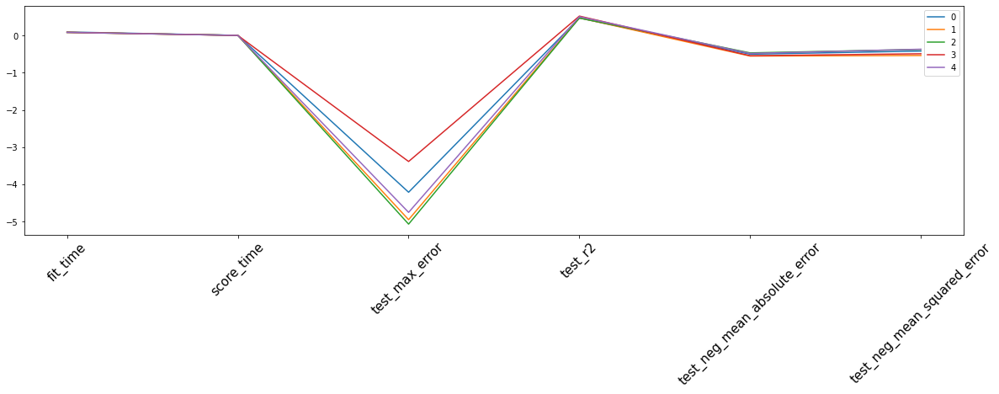

In [413]:
pd.DataFrame(cv_results).T.plot(figsize=(20,5))
plt.xticks(rotation='45', size=15)
plt.show()

# Heatmap Plotting Conflicted areas

In [414]:
heat_plot = geo_df_lis.copy()[['linkid', 'geometry', 'Speed_Diff_Mean', 'ThirdQuartil_of_velocity_of_Vehicle_Traffic']]


In [415]:
heat_plot.Speed_Diff_Mean.describe()
# the speed diff goes from -6.13 to 4.583590
## negatives == overspeeding, positives == under the max speed

count    8669.000000
mean        0.042253
std         0.929110
min        -6.130229
25%        -0.538462
50%         0.007388
75%         0.540001
max         4.583590
Name: Speed_Diff_Mean, dtype: float64

In [416]:
# heat_plot.ThirdQuartil_of_velocity_of_Vehicle_Traffic

In [417]:
# lets only take the worse 33% of roads => avoid high memory usage
heat_plot_slice = heat_plot[heat_plot.Speed_Diff_Mean < heat_plot.Speed_Diff_Mean.quantile(.33)]
# lets invert speed diff to positive is worse than negative
heat_plot_slice['scaled_speed'] = heat_plot_slice.Speed_Diff_Mean*(-1)
# lets scale the speed diff in a range of 0,1
scale = MinMaxScaler()
heat_plot_slice['scaled_speed'] = scale.fit_transform(heat_plot_slice[['scaled_speed']])

/Users/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
/Users/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [418]:
# buffering to make the roads more visible
heat_plot_slice_buf = heat_plot_slice.copy()
heat_plot_slice_buf['geometry'] = heat_plot_slice_buf.geometry.buffer(.001)

<ipython-input-418-f139f5fd1b24>:3: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  heat_plot_slice_buf['geometry'] = heat_plot_slice_buf.geometry.buffer(.001)


In [419]:
m = Map([38.74288, -9.16624], zoom_start=12, tiles='cartodbpositron') # tile is not too intensive in the bg

buf_layer = FeatureGroup(name="roads_buf", show=True)
roads_buf = Choropleth(geo_data=heat_plot_slice_buf, # geo_data
                       data=heat_plot_slice_buf, # same data to look for the color intensity
                       highlight=True, 
                       columns=['linkid', 'scaled_speed'], # chose the columns to look for [key, color_intensity]
                       key_on='properties.linkid', # chose the key
                       fill_color="OrRd", # color brewer
                       fill_opacity=0.9,
                       line_opacity=0.0, # no black lines around 
                      ).geojson.add_child(GeoJsonTooltip(['linkid'])) # for mouseover information

roads_buf.add_to(buf_layer)
buf_layer.add_to(m)

LayerControl().add_to(m)

m

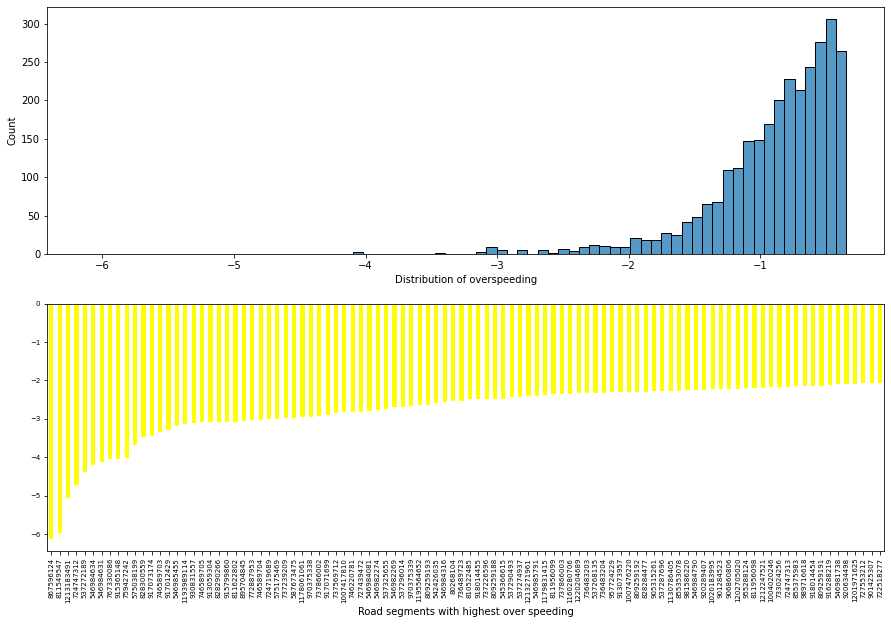

In [516]:
heat_graph_slice = pd.DataFrame(heat_plot_slice.sort_values(by='Speed_Diff_Mean').set_index('linkid'))
plt.figure(figsize=(15,10))
plt.subplot(2,1,1)
plt.xlabel('Distribution of overspeeding')
sns.histplot(heat_graph_slice.Speed_Diff_Mean, kde=False)
ax = plt.subplot(2,1,2)
heat_graph_slice.Speed_Diff_Mean.head(100).plot(kind='bar', colormap='autumn_r', fontsize=7, xlabel='Road segments with highest over speeding')
plt.show()

In [ ]:
## add future steps: 
### match the data with real crash reports from lisbon to proof our hypothesis
### close the circle from our prior hypothesis
### story looks good! commenting is good and needed!
